In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [112]:
data=pd.read_csv('OnlineNewsPopularity.csv')
data.head()

,url,timedelta,n_tokens_title,n_tokens_content,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,...,min_positive_polarity,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,shares
0,http://mashable.com/2013/01/07/amazon-instant-...,731.0,12.0,219.0,0.663594,1.0,0.815385,4.0,2.0,1.0,...,0.100000,0.7,-0.350000,-0.600,-0.200000,0.500000,-0.187500,0.000000,0.187500,593
1,http://mashable.com/2013/01/07/ap-samsung-spon...,731.0,9.0,255.0,0.604743,1.0,0.791946,3.0,1.0,1.0,...,0.033333,0.7,-0.118750,-0.125,-0.100000,0.000000,0.000000,0.500000,0.000000,711
2,http://mashable.com/2013/01/07/apple-40-billio...,731.0,9.0,211.0,0.575130,1.0,0.663866,3.0,1.0,1.0,...,0.100000,1.0,-0.466667,-0.800,-0.133333,0.000000,0.000000,0.500000,0.000000,1500
3,http://mashable.com/2013/01/07/astronaut-notre...,731.0,9.0,531.0,0.503788,1.0,0.665635,9.0,0.0,1.0,...,0.136364,0.8,-0.369697,-0.600,-0.166667,0.000000,0.000000,0.500000,0.000000,1200
4,http://mashable.com/2013/01/07/att-u-verse-apps/,731.0,13.0,1072.0,0.415646,1.0,0.540890,19.0,19.0,20.0,...,0.033333,1.0,-0.220192,-0.500,-0.050000,0.454545,0.136364,0.045455,0.136364,505


In [34]:
def fun(x):
    if (x<=1400):
        return 0
    else :
        return 1
data['popularity']=data[' shares'].apply(lambda x:fun(x))

In [20]:
data.info() # already all the columns are numerical 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39644 entries, 0 to 39643
Data columns (total 62 columns):
url                               39644 non-null object
 timedelta                        39644 non-null float64
 n_tokens_title                   39644 non-null float64
 n_tokens_content                 39644 non-null float64
 n_unique_tokens                  39644 non-null float64
 n_non_stop_words                 39644 non-null float64
 n_non_stop_unique_tokens         39644 non-null float64
 num_hrefs                        39644 non-null float64
 num_self_hrefs                   39644 non-null float64
 num_imgs                         39644 non-null float64
 num_videos                       39644 non-null float64
 average_token_length             39644 non-null float64
 num_keywords                     39644 non-null float64
 data_channel_is_lifestyle        39644 non-null float64
 data_channel_is_entertainment    39644 non-null float64
 data_channel_is_bus              396

In [113]:
data.columns=data.columns.str.replace(' ','')

In [114]:
data.drop(columns=['url','timedelta'],axis=1,inplace=True)

In [23]:
data.columns # is_weekend column should be remove it is repetitive

Index(['n_tokens_title', 'n_tokens_content', 'n_unique_tokens',
       'n_non_stop_words', 'n_non_stop_unique_tokens', 'num_hrefs',
       'num_self_hrefs', 'num_imgs', 'num_videos', 'average_token_length',
       'num_keywords', 'data_channel_is_lifestyle',
       'data_channel_is_entertainment', 'data_channel_is_bus',
       'data_channel_is_socmed', 'data_channel_is_tech',
       'data_channel_is_world', 'kw_min_min', 'kw_max_min', 'kw_avg_min',
       'kw_min_max', 'kw_max_max', 'kw_avg_max', 'kw_min_avg', 'kw_max_avg',
       'kw_avg_avg', 'self_reference_min_shares', 'self_reference_max_shares',
       'self_reference_avg_sharess', 'weekday_is_monday', 'weekday_is_tuesday',
       'weekday_is_wednesday', 'weekday_is_thursday', 'weekday_is_friday',
       'weekday_is_saturday', 'weekday_is_sunday', 'is_weekend', 'LDA_00',
       'LDA_01', 'LDA_02', 'LDA_03', 'LDA_04', 'global_subjectivity',
       'global_sentiment_polarity', 'global_rate_positive_words',
       'global_rate_negat

# descriptive stastistics 

# central tendency 
meand ,median 

In [125]:
#some feature  has outlier there 
# some feature has high standard deaviation ,means spreadness is high 
#n_tokens_contentn_non_stop_unique_tokens

(39644, 59)

In [123]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
n_tokens_title,39644.0,10.398749,2.114037,2.00000,9.000000,10.000000,12.000000,23.000000
n_tokens_content,39644.0,546.514731,471.107508,0.00000,246.000000,409.000000,716.000000,8474.000000
n_unique_tokens,39644.0,0.548216,3.520708,0.00000,0.470870,0.539226,0.608696,701.000000
n_non_stop_words,39644.0,0.996469,5.231231,0.00000,1.000000,1.000000,1.000000,1042.000000
n_non_stop_unique_tokens,39644.0,0.689175,3.264816,0.00000,0.625739,0.690476,0.754630,650.000000
num_hrefs,39644.0,10.883690,11.332017,0.00000,4.000000,8.000000,14.000000,304.000000
num_self_hrefs,39644.0,3.293638,3.855141,0.00000,1.000000,3.000000,4.000000,116.000000
num_imgs,39644.0,4.544143,8.309434,0.00000,1.000000,1.000000,4.000000,128.000000
num_videos,39644.0,1.249874,4.107855,0.00000,0.000000,0.000000,1.000000,91.000000
average_token_length,39644.0,4.548239,0.844406,0.00000,4.478404,4.664082,4.854839,8.041534


In [128]:
data.max()-data.min() # this show the range of each feature

n_tokens_title                       21.000000
n_tokens_content                   8474.000000
n_unique_tokens                     701.000000
n_non_stop_words                   1042.000000
n_non_stop_unique_tokens            650.000000
num_hrefs                           304.000000
num_self_hrefs                      116.000000
num_imgs                            128.000000
num_videos                           91.000000
average_token_length                  8.041534
num_keywords                          9.000000
data_channel_is_lifestyle             1.000000
data_channel_is_entertainment         1.000000
data_channel_is_bus                   1.000000
data_channel_is_socmed                1.000000
data_channel_is_tech                  1.000000
data_channel_is_world                 1.000000
kw_min_min                          378.000000
kw_max_min                       298400.000000
kw_avg_min                        42828.857143
kw_min_max                       843300.000000
kw_max_max   

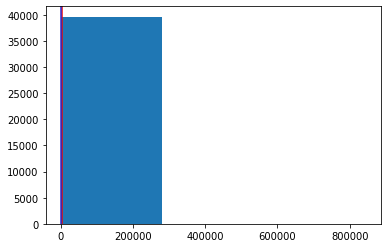

In [143]:
plt.hist(data['shares'],bins=3,log=False)  # there is right skew outlier are present that affect the model
plt.axvline(data['shares'].mean(),color='#ed0909')
plt.axvline(data['shares'].median(),color='#2a22c9')

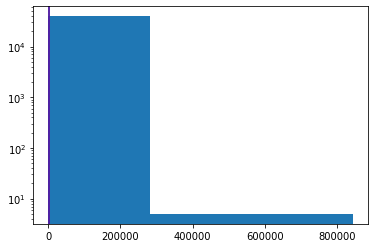

In [144]:
plt.hist(data['shares'],bins=3,log=True)
plt.axvline(data['shares'].mean(),color='#ed0909')# some small change after log transformation 
plt.axvline(data['shares'].median(),color='#2a22c9')

In [162]:
np.percentile(data['shares'],99)

31656.99999999997

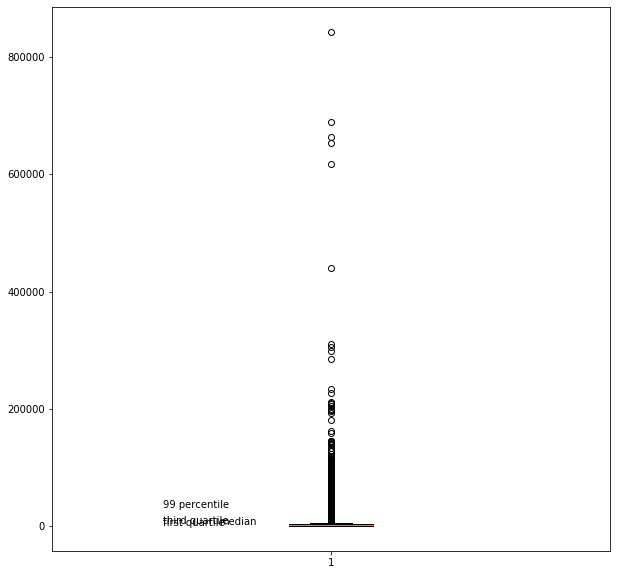

In [163]:
# understanding the summary of statistics 
plt.figure(figsize=(10,10))
plt.boxplot(data['shares'])
plt.text(y=1400,x=0.80,s='median')
plt.text(y=946,x=0.70,s='first quartile')   # from this we can say that this column 99 percentil value are come in  31656
plt.text(y=2800,x=0.70,s='third quartile')  # it has to be transformed or remove the outlier
plt.text(y=31656,x=0.70,s='99 percentile ') # 
plt.show()

In [164]:
data.var() # high variance means the distance between data points and the mean are so high
          # spreadness is high data is so disperesed

n_tokens_title                   4.469152e+00
n_tokens_content                 2.219423e+05
n_unique_tokens                  1.239539e+01
n_non_stop_words                 2.736578e+01
n_non_stop_unique_tokens         1.065903e+01
num_hrefs                        1.284146e+02
num_self_hrefs                   1.486211e+01
num_imgs                         6.904669e+01
num_videos                       1.687447e+01
average_token_length             7.130208e-01
num_keywords                     3.644779e+00
data_channel_is_lifestyle        5.014418e-02
data_channel_is_entertainment    1.463257e-01
data_channel_is_bus              1.329401e-01
data_channel_is_socmed           5.516435e-02
data_channel_is_tech             1.509672e-01
data_channel_is_world            1.673864e-01
kw_min_min                       4.848785e+03
kw_max_min                       1.488409e+07
kw_avg_min                       3.853726e+05
kw_min_max                       3.362380e+09
kw_max_max                       4

In [165]:
data.std() # same thing come from variance and std , how far data points from the mean 
   # data has much dispersion and some feature has low std they are closely pack or data are less dispersed

n_tokens_title                        2.114037
n_tokens_content                    471.107508
n_unique_tokens                       3.520708
n_non_stop_words                      5.231231
n_non_stop_unique_tokens              3.264816
num_hrefs                            11.332017
num_self_hrefs                        3.855141
num_imgs                              8.309434
num_videos                            4.107855
average_token_length                  0.844406
num_keywords                          1.909130
data_channel_is_lifestyle             0.223929
data_channel_is_entertainment         0.382525
data_channel_is_bus                   0.364610
data_channel_is_socmed                0.234871
data_channel_is_tech                  0.388545
data_channel_is_world                 0.409129
kw_min_min                           69.633215
kw_max_min                         3857.990877
kw_avg_min                          620.783887
kw_min_max                        57986.029357
kw_max_max   

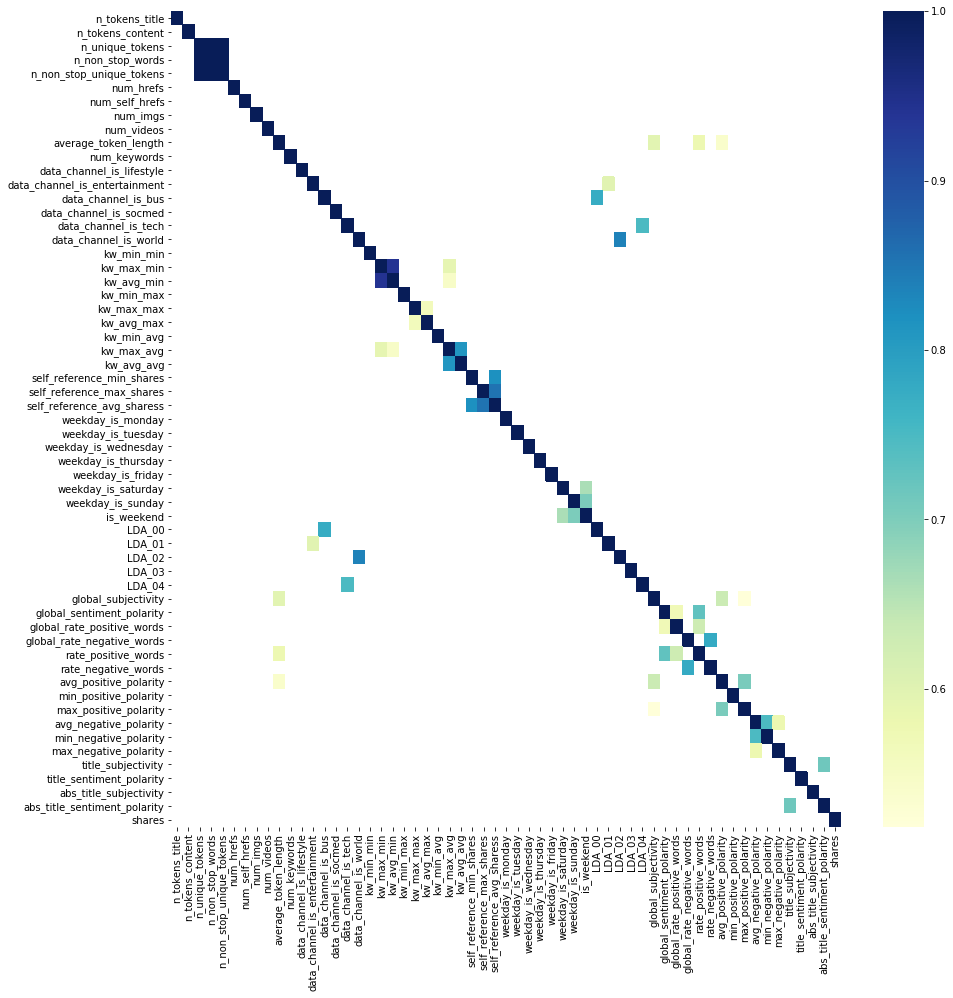

In [203]:
plt.figure(figsize=(15,15))
sns.heatmap(data.corr()[(data.corr()>0.5 )],cmap="YlGnBu")
plt.show()

In [181]:
# from this map we can able to predict much information 
# some feature has high correlation  most of feature has no correlation but some has amazing values 
data.corr()[(data.corr()>0.5 )]
#n_non_stop_words  vs n_unique_tokens ,vs 
#(n_non_stop_unique_tokens vs [n_non_stop_words) vs n_non_stop_unique_tokens]
#n_unique_tokens vs n_non_stop_unique_tokens
#global_subjectivity vs average_token_length,max_positive_polarity
#rate_positive_words,avg positive word vs average_token_length

,n_tokens_title,n_tokens_content,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,num_videos,average_token_length,...,min_positive_polarity,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,shares
n_tokens_title,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
n_tokens_content,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
n_unique_tokens,NaN,NaN,1.000000,0.999572,0.999852,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
n_non_stop_words,NaN,NaN,0.999572,1.000000,0.999532,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
n_non_stop_unique_tokens,NaN,NaN,0.999852,0.999532,1.000000,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
num_hrefs,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
num_self_hrefs,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
num_imgs,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
num_videos,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
average_token_length,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [22]:
# we make the groups of data like no of words 
words=data.iloc[:,0:5]
words['popularity']=data['popularity']
words['average_token_length']=data['average_token_length']
words['num_keywords']=data['num_keywords']

In [23]:
words.head()

,n_tokens_title,n_tokens_content,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,popularity,average_token_length,num_keywords
0,12.0,219.0,0.663594,1.0,0.815385,unpopular,4.680365,5.0
1,9.0,255.0,0.604743,1.0,0.791946,unpopular,4.913725,4.0
2,9.0,211.0,0.575130,1.0,0.663866,popular,4.393365,6.0
3,9.0,531.0,0.503788,1.0,0.665635,unpopular,4.404896,7.0
4,13.0,1072.0,0.415646,1.0,0.540890,unpopular,4.682836,7.0


In [14]:
data.columns

Index(['n_tokens_title', 'n_tokens_content', 'n_unique_tokens',
       'n_non_stop_words', 'n_non_stop_unique_tokens', 'num_hrefs',
       'num_self_hrefs', 'num_imgs', 'num_videos', 'average_token_length',
       'num_keywords', 'data_channel_is_lifestyle',
       'data_channel_is_entertainment', 'data_channel_is_bus',
       'data_channel_is_socmed', 'data_channel_is_tech',
       'data_channel_is_world', 'kw_min_min', 'kw_max_min', 'kw_avg_min',
       'kw_min_max', 'kw_max_max', 'kw_avg_max', 'kw_min_avg', 'kw_max_avg',
       'kw_avg_avg', 'self_reference_min_shares', 'self_reference_max_shares',
       'self_reference_avg_sharess', 'weekday_is_monday', 'weekday_is_tuesday',
       'weekday_is_wednesday', 'weekday_is_thursday', 'weekday_is_friday',
       'weekday_is_saturday', 'weekday_is_sunday', 'is_weekend', 'LDA_00',
       'LDA_01', 'LDA_02', 'LDA_03', 'LDA_04', 'global_subjectivity',
       'global_sentiment_polarity', 'global_rate_positive_words',
       'global_rate_negat

KeyError: "None of [Index(['unpopular', 'unpopular', 'popular', 'unpopular', 'unpopular',\n       'unpopular', 'unpopular', 'unpopular', 'popular', 'unpopular',\n       ...\n       'unpopular', 'unpopular', 'popular', 'unpopular', 'unpopular',\n       'popular', 'popular', 'popular', 'unpopular', 'unpopular'],\n      dtype='object', length=39644)] are in the [columns]"

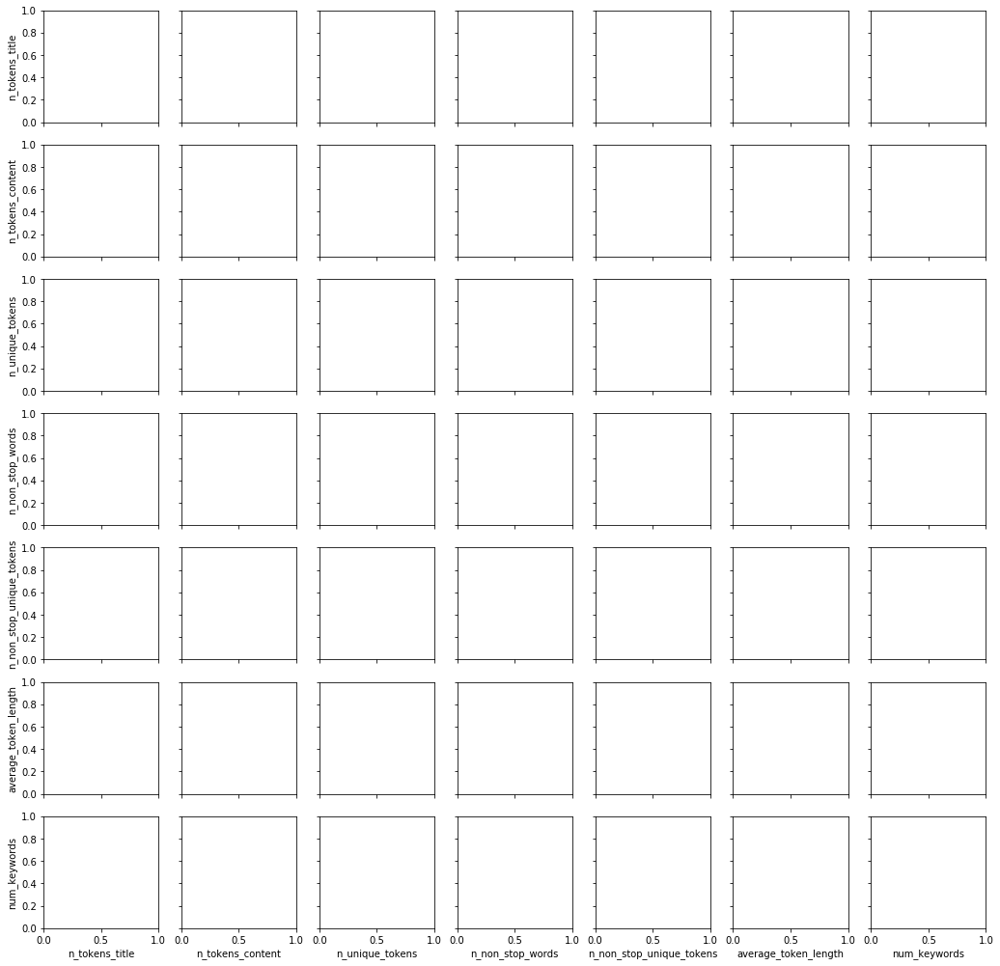

In [20]:
sns.pairplot(words,hue=words['popularity'])

In [191]:
# from this we can say that dense region of share are where , there has 10 -15 words in title 
# from this we can't interpret better which show good relatin ship
# no of shares are work well with limited average length of word in content 
#no of shares are increase with increase in no of keyword 

In [122]:
# no of links ans videos , images,other links
links=data.iloc[:,5:9]
links['shares']=data['shares']

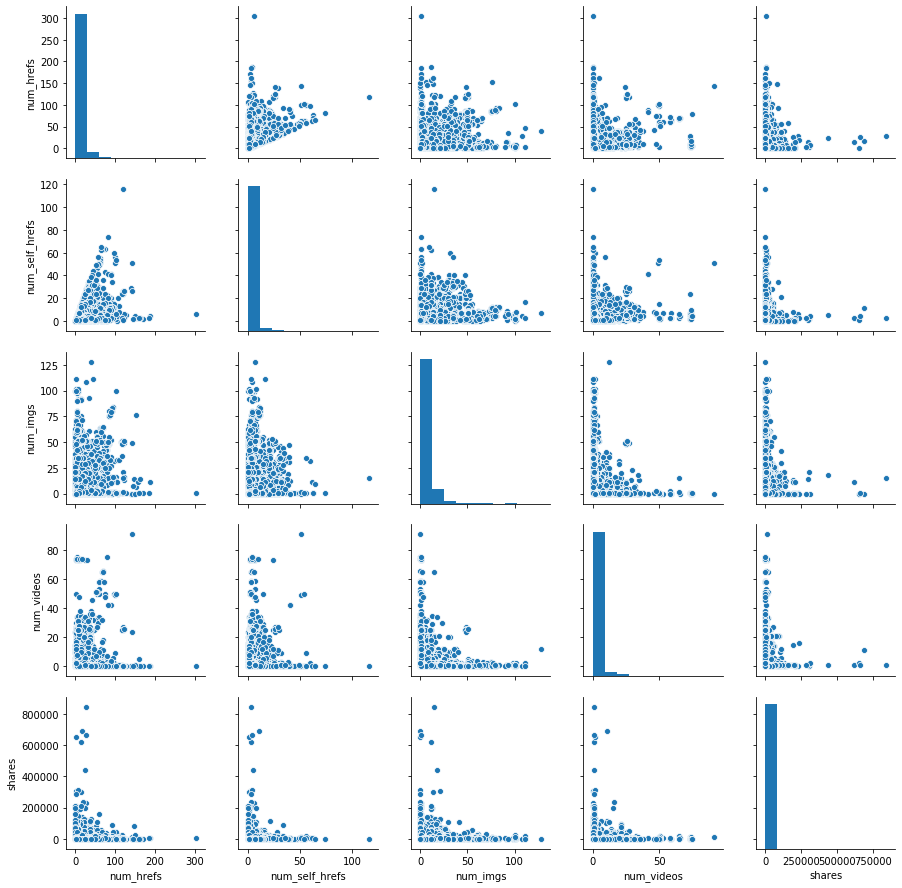

In [202]:
sns.pairplot(links)

In [ ]:
# dense area says less no of links videos images are high shares 
# high no of links ,videos ,images, other links are not much impact on shares 

In [211]:
category=data.iloc[:,11:17]
category['LDA_00']=data['LDA_00']
category['LDA_01']=data['LDA_01']
category['LDA_02']=data['LDA_02']
category['LDA_03']=data['LDA_03']
category['LDA_04']=data['LDA_04']
category['shares']=data['shares']

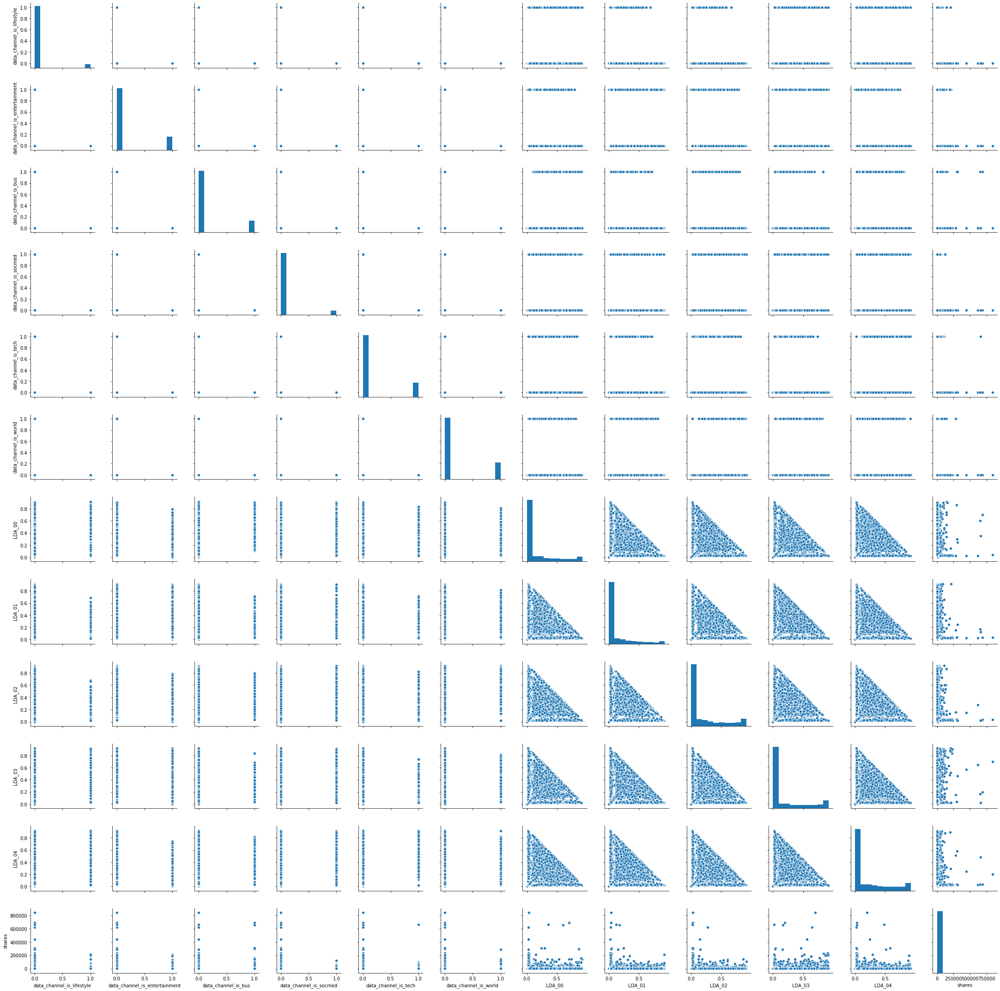

In [212]:
sns.pairplot(category)

In [ ]:
# from graph we can conclude that business technology world news has good impact on shares 
#from lda feature with shares all have same relation as we know that its is the collection of top 5 articles which is different
#category,it tells that how much close our article to this 

In [218]:
min_min=data.iloc[:,17:29]
min_min['shares']=data['shares']

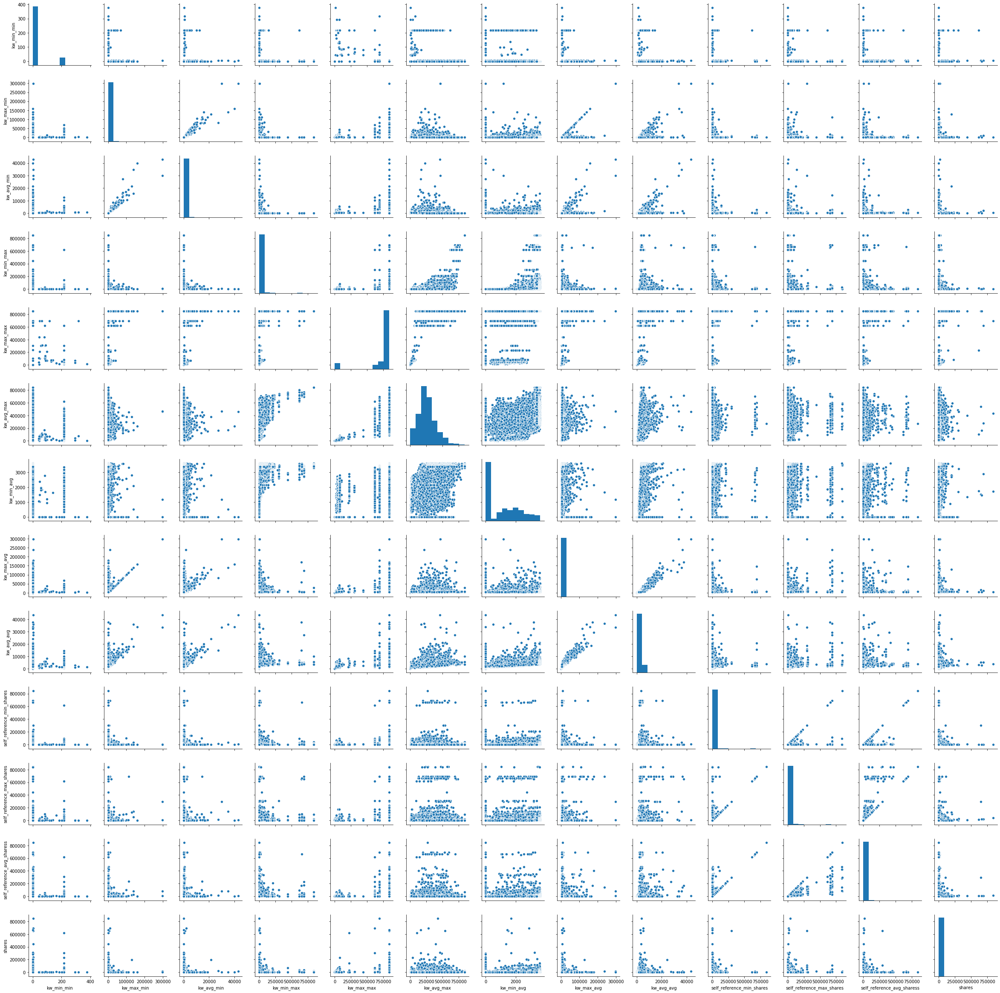

In [219]:
sns.pairplot(min_min)

In [ ]:
#worst keyword min shares vs shares we can say in this case shares is not much high
# IN all worst keyword are same sitution no of shares is minimum 
#when we compare worst keyword with best keyword then it is clear no of shares is affected 
# shares of reference article is not clear

In [224]:
day=data.iloc[:,29:37]
day['shares']=data['shares']

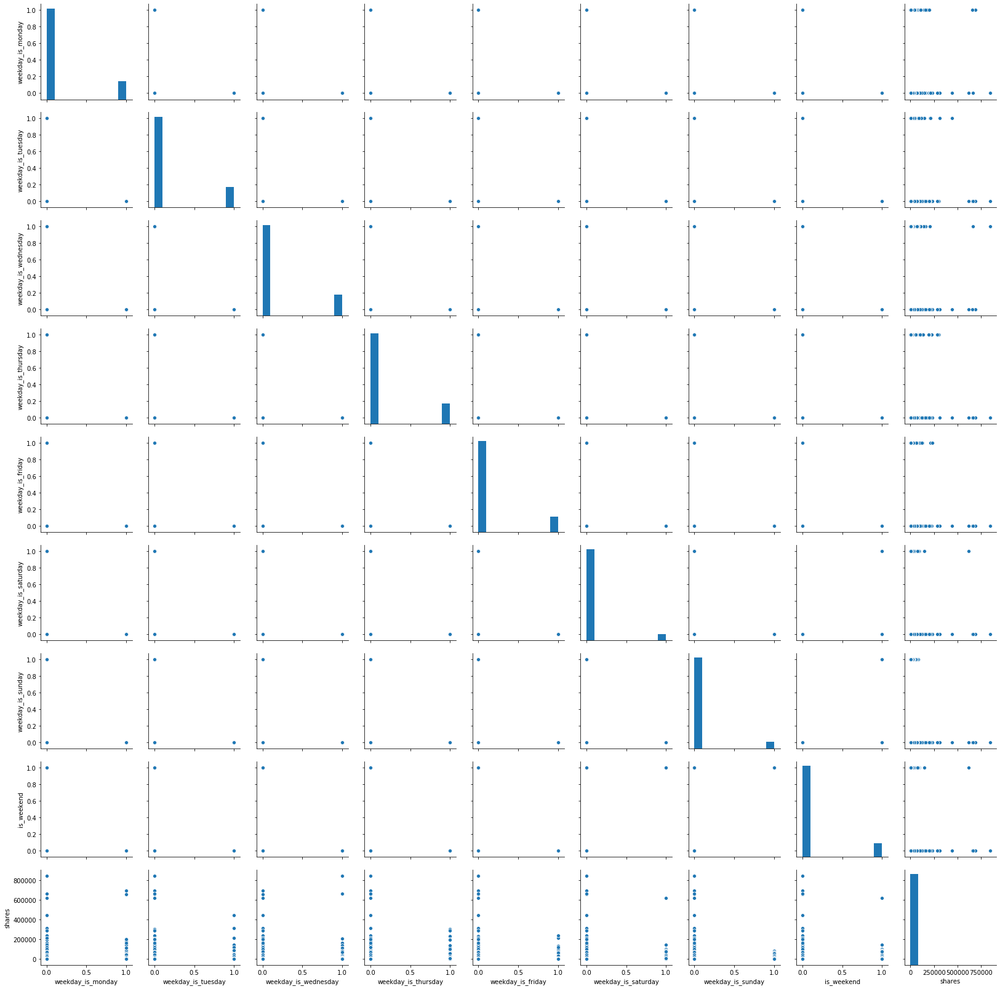

In [225]:
sns.pairplot(day)

In [ ]:
#from above graph we can say  weekday is affecte the shares when article publish on weekday then most probable 
#it will got high shares 
# on weekend no of shares is not much affected ,if we compare sunday saturday then sunday is low shares affector
# from this we can say article will publish on weekdays
# and avoid weekends for publishing article

In [12]:
polarity=data.iloc[:,42:58]
polarity['shares']=data['shares']

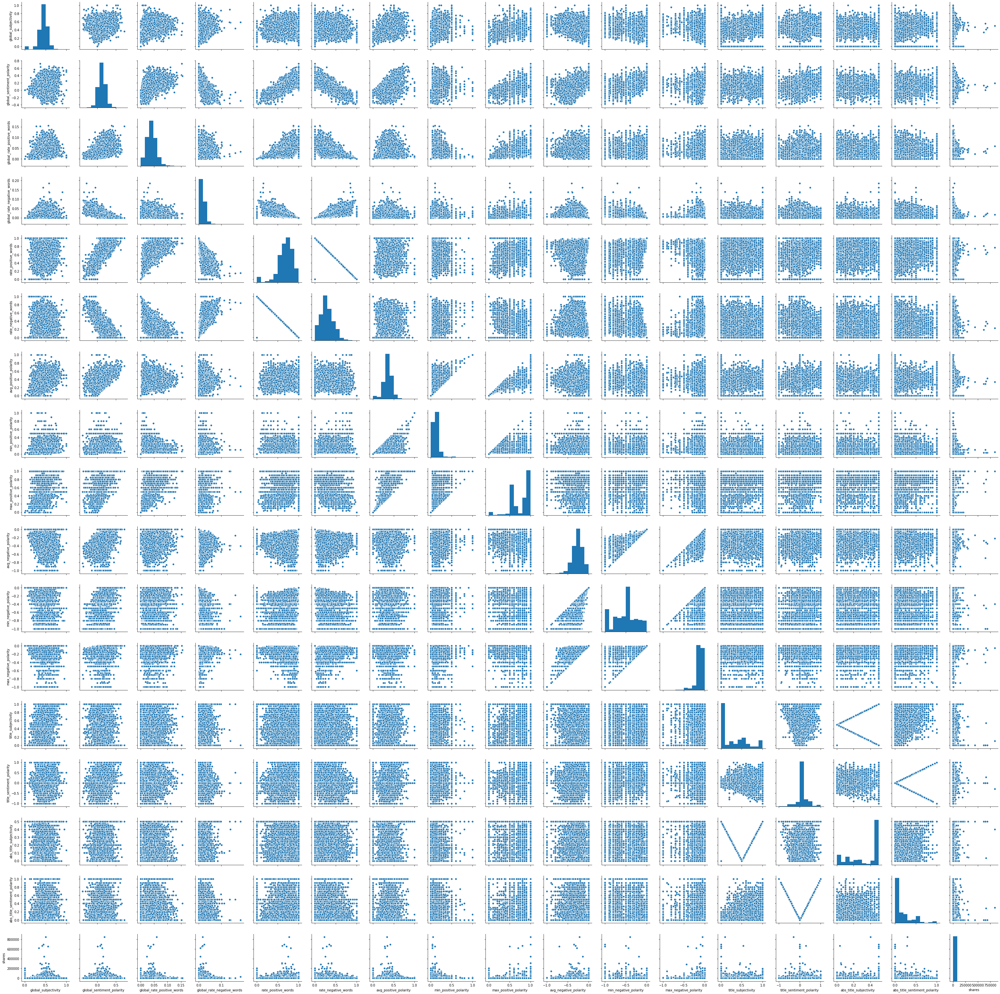

In [228]:
sns.pairplot(polarity)

In [9]:
data['global_sentiment_polarity'].max()

0.727840909091

In [10]:
data['global_sentiment_polarity'].min()

-0.39375

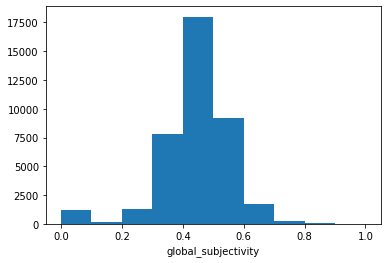

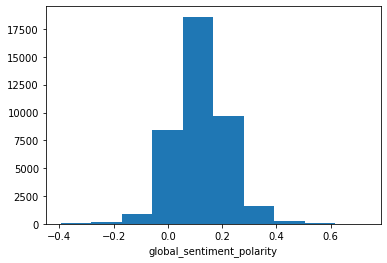

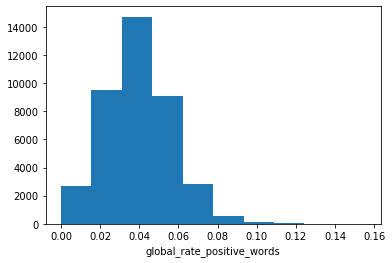

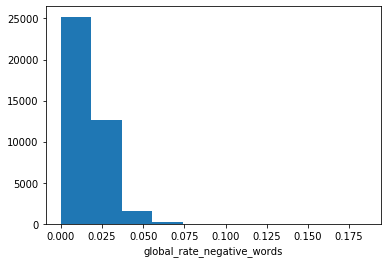

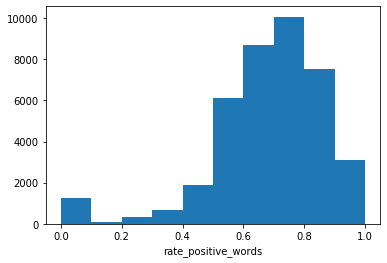

...

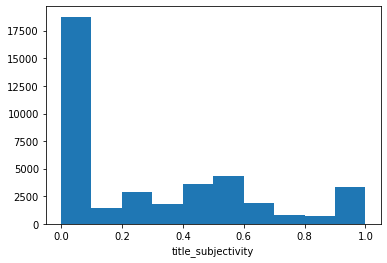

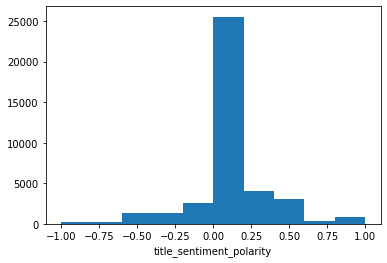

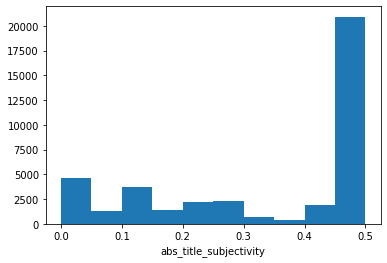

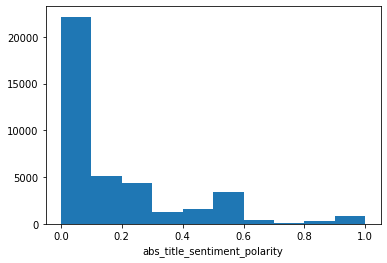

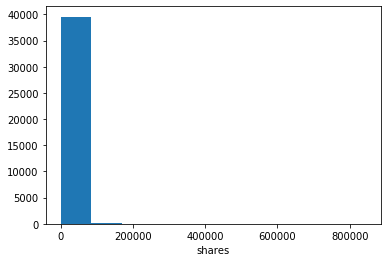

In [19]:
for i in polarity.columns:
    plt.hist(data[i])
    plt.xlabel(i)
    plt.show()

In [20]:
data.head()

,n_tokens_title,n_tokens_content,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,num_videos,average_token_length,...,min_positive_polarity,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,shares
0,12.0,219.0,0.663594,1.0,0.815385,4.0,2.0,1.0,0.0,4.680365,...,0.100000,0.7,-0.350000,-0.600,-0.200000,0.500000,-0.187500,0.000000,0.187500,593
1,9.0,255.0,0.604743,1.0,0.791946,3.0,1.0,1.0,0.0,4.913725,...,0.033333,0.7,-0.118750,-0.125,-0.100000,0.000000,0.000000,0.500000,0.000000,711
2,9.0,211.0,0.575130,1.0,0.663866,3.0,1.0,1.0,0.0,4.393365,...,0.100000,1.0,-0.466667,-0.800,-0.133333,0.000000,0.000000,0.500000,0.000000,1500
3,9.0,531.0,0.503788,1.0,0.665635,9.0,0.0,1.0,0.0,4.404896,...,0.136364,0.8,-0.369697,-0.600,-0.166667,0.000000,0.000000,0.500000,0.000000,1200
4,13.0,1072.0,0.415646,1.0,0.540890,19.0,19.0,20.0,0.0,4.682836,...,0.033333,1.0,-0.220192,-0.500,-0.050000,0.454545,0.136364,0.045455,0.136364,505


In [6]:
data.isnull().sum().sum() # data has zero null values 

0

In [32]:
data.head()

,url,timedelta,n_tokens_title,n_tokens_content,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,...,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,shares,popularity
0,http://mashable.com/2013/01/07/amazon-instant-...,731.0,12.0,219.0,0.663594,1.0,0.815385,4.0,2.0,1.0,...,0.7,-0.350000,-0.600,-0.200000,0.500000,-0.187500,0.000000,0.187500,593,0
1,http://mashable.com/2013/01/07/ap-samsung-spon...,731.0,9.0,255.0,0.604743,1.0,0.791946,3.0,1.0,1.0,...,0.7,-0.118750,-0.125,-0.100000,0.000000,0.000000,0.500000,0.000000,711,0
2,http://mashable.com/2013/01/07/apple-40-billio...,731.0,9.0,211.0,0.575130,1.0,0.663866,3.0,1.0,1.0,...,1.0,-0.466667,-0.800,-0.133333,0.000000,0.000000,0.500000,0.000000,1500,1
3,http://mashable.com/2013/01/07/astronaut-notre...,731.0,9.0,531.0,0.503788,1.0,0.665635,9.0,0.0,1.0,...,0.8,-0.369697,-0.600,-0.166667,0.000000,0.000000,0.500000,0.000000,1200,0
4,http://mashable.com/2013/01/07/att-u-verse-apps/,731.0,13.0,1072.0,0.415646,1.0,0.540890,19.0,19.0,20.0,...,1.0,-0.220192,-0.500,-0.050000,0.454545,0.136364,0.045455,0.136364,505,0


In [99]:
X=data.drop(columns=['shares'],axis=1)
y=data['shares']
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
scaletr=sc.fit_transform(x_train)
scalet=sc.transform(x_test)
from sklearn.linear_model import LinearRegression
lr=LinearRegression()
from sklearn.metrics import r2_score

model=lr.fit(x_train,y_train)
ypred=lr.predict(x_test)
print(r2_score(y_test,ypred))
print(lr.score(x_train,y_train))
print(lr.score(x_test,y_test))
print(np.sqrt(mean_squared_error(y_test,ypred)))


0.07831704729545652
0.08224360986478452
0.07831704729545652
32.59521064571214


In [115]:
data['shares']=np.sqrt(data['shares'])

In [105]:
X=data.drop(columns=['shares'],axis=1)
y=data['shares']
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
scaletr=sc.fit_transform(x_train)
scalet=sc.transform(x_test)
from sklearn.linear_model import LinearRegression
lr=LinearRegression()
from sklearn.metrics import r2_score

model=lr.fit(x_train,y_train)
ypred=lr.predict(x_test)
print(r2_score(y_test,ypred))
print(lr.score(x_train,y_train))
print(lr.score(x_test,y_test))
print(np.sqrt(mean_squared_error(y_test,ypred)))


0.05754513438283815
0.07240364263088162
0.05754513438283815
3751.104740683549


In [48]:
model=lr.fit(x_train,y_train)
ypred=lr.predict(x_test)

In [56]:
from sklearn.metrics import r2_score

model=lr.fit(x_train,y_train)
ypred=lr.predict(x_test)
print(r2_score(y_test,ypred))
print(lr.score(x_train,y_train))
print(lr.score(x_test,y_test))
print(np.sqrt(mean_squared_error(y_test,ypred)))


0.018660800180663406
0.024571322704844967
0.018660800180663406
13001.636967583052


In [57]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
scaletr=sc.fit_transform(x_train)
scalet=sc.transform(x_test)
from sklearn.metrics import r2_score

model=lr.fit(scaletr,y_train)
ypred=lr.predict(scalet)
print(r2_score(y_test,ypred))
print(lr.score(scaletr,y_train))
print(lr.score(scalet,y_test))
print(np.sqrt(mean_squared_error(y_test,ypred)))


0.018660504653492338
0.024571075045767277
0.018660504653492338
13001.638925283663


In [53]:
from sklearn.tree import DecisionTreeRegressor
dt=DecisionTreeRegressor()
model=dt.fit(x_train,y_train)
ypred=dt.predict(x_test)
print(dt.score(x_train,y_train))
print(dt.score(x_test,y_test))
from sklearn.metrics import r2_score,mean_squared_error
print(r2_score(y_test,ypred))
print(np.sqrt(mean_squared_error(y_test,ypred)))

1.0
-1.5769241946264332
-1.5769241946264332
21068.77491467718


In [151]:
X=data.drop(columns=['shares'],axis=1)
y=data['shares']
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)
from sklearn.tree import DecisionTreeRegressor
dt=DecisionTreeRegressor()
model=dt.fit(x_train,y_train) # sqrt
ypred=dt.predict(x_test)
print(dt.score(x_train,y_train))
print(dt.score(x_test,y_test))
from sklearn.metrics import r2_score,mean_squared_error
print(r2_score(y_test,ypred))
print(np.sqrt(mean_squared_error(y_test,ypred)))

1.0
-0.8729239324446456
-0.8729239324446456
46.46469429209092


In [61]:

from sklearn.tree import DecisionTreeRegressor
dt=DecisionTreeRegressor()
model=dt.fit(x_train,y_train)
ypred=dt.predict(x_test)
print(dt.score(x_train,y_train))
print(dt.score(x_test,y_test))
from sklearn.metrics import r2_score,mean_squared_error
print(r2_score(y_test,ypred))
print(np.sqrt(mean_squared_error(y_test,ypred)))

1.0
-1.1261902737779192
-1.1261902737779192
19137.690442128034


In [54]:
from sklearn.ensemble import RandomForestRegressor
rf=RandomForestRegressor()
model=rf.fit(x_train,y_train)
y_pred=rf.predict(x_test)
from sklearn.metrics import r2_score
print(r2_score(y_test,y_pred))
print(rf.score(x_train,y_train))
print(rf.score(x_test,y_test))
print(np.sqrt(mean_squared_error(y_test,y_pred)))

-0.015386269401178154
0.8583233175411503
-0.015386269401178154
21068.77491467718


In [111]:
X=data.drop(columns=['shares'],axis=1)
y=data['shares']
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42) #sqrt
from sklearn.ensemble import RandomForestRegressor
rf=RandomForestRegressor()
model=rf.fit(x_train,y_train)
y_pred=rf.predict(x_test)
from sklearn.metrics import r2_score
print(r2_score(y_test,y_pred))
print(rf.score(x_train,y_train))
print(rf.score(x_test,y_test))
print(np.sqrt(mean_squared_error(y_test,y_pred)))

0.060962336129029016
0.8663881085748812
0.060962336129029016
32.90065320123025


In [62]:
from sklearn.ensemble import RandomForestRegressor
rf=RandomForestRegressor()
model=rf.fit(x_train,y_train)
y_pred=rf.predict(x_test)
from sklearn.metrics import r2_score
print(r2_score(y_test,y_pred))
print(rf.score(x_train,y_train))
print(rf.score(x_test,y_test))
print(np.sqrt(mean_squared_error(y_test,y_pred)))

-0.006613501468507144
0.8521629880569063
-0.006613501468507144
13168.000594676363


In [55]:
print(np.sqrt(mean_squared_error(y_test,y_pred)))

13225.256538221565


In [45]:
pd.DataFrame(dt.feature_importances_,index=x_test.columns)

,0
n_tokens_title,0.010097
n_tokens_content,0.029764
n_unique_tokens,0.194008
n_non_stop_words,0.000523
n_non_stop_unique_tokens,0.025487
num_hrefs,0.019654
num_self_hrefs,0.013194
num_imgs,0.007862
num_videos,0.007043
average_token_length,0.030528


# split the data

In [5]:
X=data.drop('shares',axis=1)
y=data['shares']

In [24]:
from sklearn.model_selection import train_test_split

In [ ]:
# we split the data beacause from this we evaluate our model like example if we train full data and apply model 
# how we confident that our model will work or not for this situation we split the data into train and test 
# a small portion of data split into test , it is unseen from every thing finally when our model ready than we pass this test 
# data to our model if our model work well on test data means our model also work well on production 
# there are many option to split the data 70:30,60:40,80:20,90:10
# it depends on data if data is large you can choose 90:10,80:20 but 70:30 is common proportion for split

In [25]:
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)

In [26]:
# we choose our basic model linear regression 
# before applying linear regression we have to check assumption of linear regression 

In [29]:
from sklearn.linear_model import LinearRegression
lr=LinearRegression()

In [30]:
model=lr.fit(x_train,y_train)
ypred=lr.predict(x_test)

In [31]:
from sklearn.metrics import r2_score

In [ ]:
# rsquare tells us how much variation of y variable explain by x variables or how much x variables compatiable with y variable
# we calculate rsquare manually and by inbuilt funtion 
# our rsquare is not good
# 1-SSE/SST

In [37]:
rsquare=1-(sum(np.square(y_test-ypred))/(sum(np.square(y_test-np.mean(y_test)))))
rsquare

0.018660800180642423

In [33]:
r2_score(y_test,ypred)

0.018660800180663406

In [42]:
print('score on train',lr.score(x_train,y_train))
print('score on test',lr.score(x_test,y_test))

score on train 0.024571322704844967
score on test 0.018660800180663406


# Use statsmodels 

In [42]:
from statsmodels.api import OLS

In [43]:
model=OLS(endog=y,exog=X).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 shares   R-squared:                       0.070
Model:                            OLS   Adj. R-squared:                  0.069
Method:                 Least Squares   F-statistic:                     48.97
Date:                Sun, 12 Jan 2020   Prob (F-statistic):               0.00
Time:                        15:38:39   Log-Likelihood:            -3.3908e+05
No. Observations:               35205   AIC:                         6.783e+05
Df Residuals:                   35150   BIC:                         6.787e+05
Df Model:                          54                                         
Covariance Type:            nonrobust                                         
=================================================================================================
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
n_tokens_title                   22.5466      9.785      2.304      0.021       3.367      41.726
n_tokens_content                 -0.0505      0.118     -0.427      0.670      -0.282       0.181
n_unique_tokens                 167.5142    838.912      0.200      0.842   -1476.779    1811.808
n_non_stop_words              -2.139e+09   9.69e+09     -0.221      0.825   -2.11e+10    1.69e+10
n_non_stop_unique_tokens        230.0752    584.628      0.394      0.694    -915.814    1375.965
num_hrefs                        20.0668      3.358      5.976      0.000      13.485      26.648
num_self_hrefs                  -33.7266      8.940     -3.772      0.000     -51.250     -16.203
num_imgs                         27.2723      4.718      5.780      0.000      18.025      36.520
num_videos                       34.9338     12.310      2.838      0.005      10.805      59.062
average_token_length           -250.1617     83.226     -3.006      0.003    -413.287     -87.036
num_keywords                      6.1362     12.685      0.484      0.629     -18.727      30.999
data_channel_is_lifestyle      -428.3993    135.417     -3.164      0.002    -693.822    -162.977
data_channel_is_entertainment  -599.6322     93.051     -6.444      0.000    -782.015    -417.249
data_channel_is_bus            -595.4221    132.216     -4.503      0.000    -854.571    -336.274
data_channel_is_socmed          248.5339    129.709      1.916      0.055      -5.699     502.767
data_channel_is_tech             -2.1605    127.943     -0.017      0.987    -252.934     248.613
data_channel_is_world          -327.1836    131.772     -2.483      0.013    -585.462     -68.905
kw_min_min                        3.0275      0.553      5.477      0.000       1.944       4.111
kw_max_min                        0.0372      0.017      2.220      0.026       0.004       0.070
kw_avg_min                       -0.2621      0.101     -2.583      0.010      -0.461      -0.063
kw_min_max                       -0.0004      0.000     -0.867      0.386      -0.001       0.000
kw_max_max                        0.0003      0.000      1.522      0.128   -8.63e-05       0.001
kw_avg_max                       -0.0012      0.000     -4.191      0.000      -0.002      -0.001
kw_min_avg                       -0.1959      0.026     -7.492      0.000      -0.247      -0.145
kw_max_avg                       -0.1244      0.009    -14.193      0.000      -0.142      -0.107
kw_avg_avg                        1.0281      0.049     20.779      0.000       0.931       1.125
self_reference_min_shares        -0.0019      0.003     -0.668      0.504      -0.008       0.004
self_reference_max_shares        -0.0038      0.002     -2.092      0.036      -0.007      -0.000
self_reference_avg_sharess        0.0132     

# our model is suffer from high bias error that why is underfitting 
# and it is not able to learn train as well as test data 

In [ ]:
# when I split our data  into 80:20 I got better rsquare than before

In [44]:
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

# we choose our basic model linear regression 
# before applying linear regression we have to check assumption of linear regression 

from sklearn.linear_model import LinearRegression
lr=LinearRegression()

model=lr.fit(x_train,y_train)
ypred=lr.predict(x_test)

from sklearn.metrics import r2_score

# rsquare tells us how much variation of y variable explain by x variables or how much x variables compatiable with y variable
# we calculate rsquare manually and by inbuilt funtion 
# our rsquare is not good
# 1-SSE/SST

rsquare=1-(sum(np.square(y_test-ypred))/(sum(np.square(y_test-np.mean(y_test)))))
print('manual rsquare',rsquare)

print('rsquare',r2_score(y_test,ypred))

print('score on train',lr.score(x_train,y_train))
print('score on test',lr.score(x_test,y_test))

manual rsquare 0.026180071647286973
rsquare 0.026180071647297076
score on train 0.021916499363106468
score on test 0.026180071647297073


In [ ]:
# when we split our data into 90:10 it is worse than first so 80:20 is better for this model 

In [46]:
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.10, random_state=42)

# we choose our basic model linear regression 
# before applying linear regression we have to check assumption of linear regression 

from sklearn.linear_model import LinearRegression
lr=LinearRegression()

model=lr.fit(x_train,y_train)
ypred=lr.predict(x_test)

from sklearn.metrics import r2_score

# rsquare tells us how much variation of y variable explain by x variables or how much x variables compatiable with y variable
# we calculate rsquare manually and by inbuilt funtion 
# our rsquare is not good
# 1-SSE/SST

rsquare=1-(sum(np.square(y_test-ypred))/(sum(np.square(y_test-np.mean(y_test)))))
print('manual rsquare',rsquare)

print('rsquare',r2_score(y_test,ypred))

print('score on train',lr.score(x_train,y_train))
print('score on test',lr.score(x_test,y_test))

manual rsquare 0.018796277645897086
rsquare 0.01879627764590064
score on train 0.023403326840233607
score on test 0.01879627764590064


In [ ]:
# overfitting : when our model suffer form high variance error and it work well on train data
# but not well test data , it capture every pattern from train data and not able to apply on test data
# we can say our model is generalisation it is very complex that why it has high variance error

# underfitting : when our model suffer from high bias error and it is not learning any thing from train as well as test data
# as you can see in this we apply linear regression model , score is very low approx 2 %  on both means our model has not 
# sufficient power to learn this data 

# rsquare is very low , it tells error proportion is very high 
# model is suffer form underfitting so its solution is we have to make complex model that learn well on train data
# then we can regularize the model and we can trade of between bias and variance error

# many reason of this situation is like data is normal or it has outlier , it need transformation 
# final conclusin in  our basic model that it is very simple ,it give us to idea about the base error that where we can start the project

In [49]:
from sklearn.metrics import mean_squared_error
print('RMSE ',np.sqrt(mean_squared_error(y_test,ypred)))

RMSE  13580.349105800738


# RMSE is very high it tells us that our your predicted value is how much far from actual value in this case it tell predicted shares is 13580 far from actual      shares

In [50]:
from sklearn.preprocessing import PolynomialFeatures
pl=PolynomialFeatures()

In [53]:
X_train=pl.fit_transform(x_train)
X_test=pl.transform(x_test)

In [55]:
from sklearn.linear_model import LinearRegression
lr=LinearRegression()

model=lr.fit(X_train,y_train)
ypred=lr.predict(X_test)

In [63]:
from sklearn.metrics import r2_score

# rsquare tells us how much variation of y variable explain by x variables or how much x variables compatiable with y variable
# we calculate rsquare manually and by inbuilt funtion 
# our rsquare is not good
# 1-SSE/SST
# model is very worst 

rsquare=1-(sum(np.square(y_test-pd.Series(ypred)))/(sum(np.square(y_test-np.mean(y_test)))))
print('manual rsquare',rsquare)

print('rsquare',r2_score(y_test,pd.Series(ypred)))

print('score on train',lr.score(X_train,y_train))
print('score on test',lr.score(X_test,y_test))

manual rsquare nan
rsquare -220.8970181860461
score on train 0.0908461516161646
score on test -220.8970181860461


# waste data

In [8]:
print(data[data['n_tokens_content']==0].shape) # no of words are zero , it is noise 
print(data.shape)
# if article has zero words means there is no article exist

(1181, 59)
(39644, 59)


In [9]:
data=data[data['n_tokens_content']!=0] # after removing this 
data.shape

(38463, 59)

In [10]:
data['n_unique_tokens']=data['n_unique_tokens'].replace(701,np.nan) #one value has greater than 1
data['n_non_stop_words']=data['n_non_stop_words'].replace(1042,np.nan)
data.dropna(inplace=True)

In [171]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
n_tokens_title,38462.0,10.382455,2.113816e+00,2.000000,9.000000,10.000000,12.000000,23.000000
n_tokens_content,38462.0,563.269201,4.682775e+02,18.000000,259.000000,423.000000,729.000000,8474.000000
n_unique_tokens,38462.0,0.546837,1.023145e-01,0.114964,0.477419,0.542982,0.611111,1.000000
n_non_stop_words,38462.0,1.000000,4.022927e-09,1.000000,1.000000,1.000000,1.000000,1.000000
n_non_stop_unique_tokens,38462.0,0.693455,1.006439e-01,0.119134,0.632588,0.693727,0.756944,1.000000
num_hrefs,38462.0,11.217877,1.134073e+01,0.000000,5.000000,8.000000,14.000000,304.000000
num_self_hrefs,38462.0,3.394597,3.869676e+00,0.000000,1.000000,3.000000,4.000000,116.000000
num_imgs,38462.0,4.561853,8.292093e+00,0.000000,1.000000,1.000000,4.000000,128.000000
num_videos,38462.0,1.263819,4.164945e+00,0.000000,0.000000,0.000000,1.000000,91.000000
average_token_length,38462.0,4.687892,2.832343e-01,3.600000,4.496245,4.674120,4.861903,8.041534


# Checking outlier 

# n_tokens_content,num_hrefs,num_self_hrefs,num_imgs,num_videos,shares

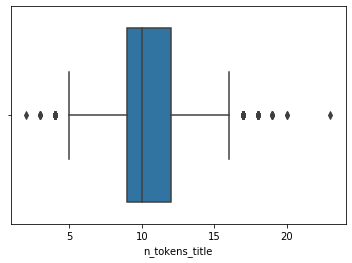

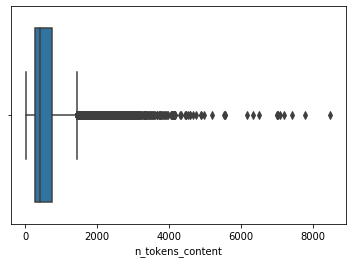

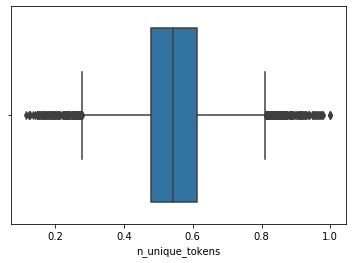

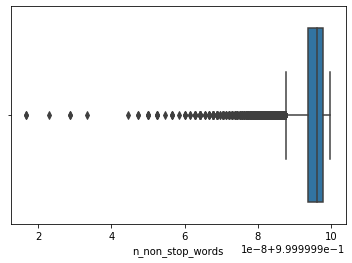

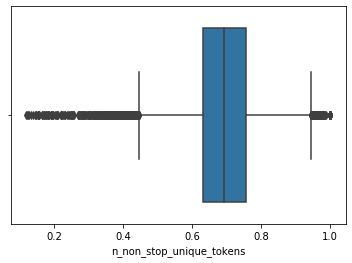

...

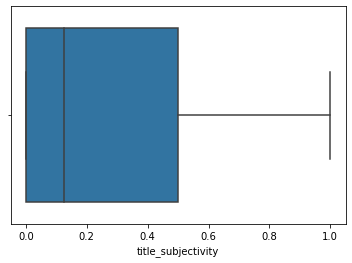

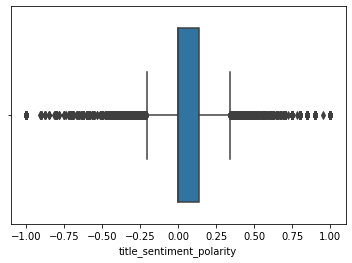

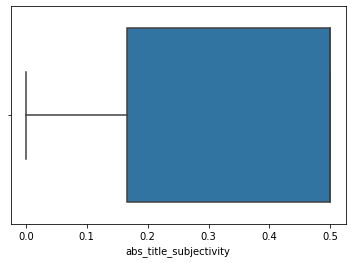

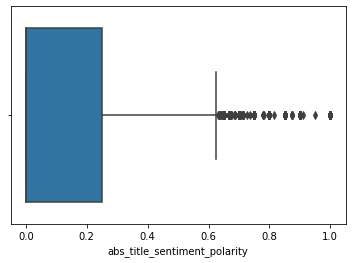

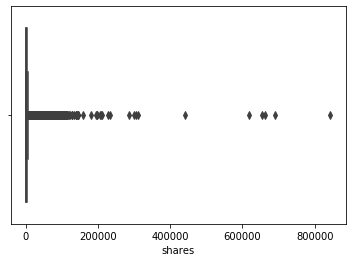

In [97]:
for i in data.columns:
    sns.boxplot(data[i])
    plt.show()

In [ ]:
# from the boxplot we can say that some feature has so many outliers that badly affect our model 
# so we have to remove this outliers lets make those features
# we removing the outlier using z score method

In [11]:
woutlier=data.copy()

In [103]:
def outliers_indices(feature):

    mid = data[feature].mean()
    sigma = data[feature].std()
    return data[(data[feature] < mid - 3*sigma) | (data[feature] > mid + 3*sigma)].index

In [104]:
#wrong_shares1 = outliers_indices('kw_avg_avg')
#wrong_shares2= outliers_indices('kw_max_avg')
#wrong_shares3= outliers_indices('kw_avg_max')
#wrong_shares4= outliers_indices('kw_max_max')
#wrong_shares5= outliers_indices('kw_min_max')
#wrong_shares6= outliers_indices('kw_avg_min')
#wrong_shares7= outliers_indices('kw_max_min')
#wrong_shares8= outliers_indices('self_reference_avg_sharess')
#wrong_shares9= outliers_indices('self_reference_max_shares')
#wrong_shares10= outliers_indices('self_reference_min_shares')
wrong_shares = outliers_indices('shares')
wrong_vid = outliers_indices('num_videos')
wrong_img = outliers_indices('num_imgs')
wrong_content = outliers_indices('n_tokens_content')
wrong_hrefs = outliers_indices('num_hrefs')
wrong_self_hrefs = outliers_indices('num_self_hrefs')
out = set(wrong_vid) | set(wrong_img) | set(wrong_content) |set(wrong_hrefs)|set(wrong_self_hrefs)|set(wrong_shares)

data.drop(out,inplace=True)

In [14]:
data.shape

(35205, 59)

In [15]:
woutlier.shape

(38462, 59)

# No of outlier present in the data 

In [16]:
woutlier.shape[0]-data.shape[0] #those affect the result

3257

In [58]:
data['constant']=1

# model after removing of outlier

In [59]:
from sklearn.model_selection import train_test_split
X=data.drop('shares',axis=1)
y=data['shares']

x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

# we choose our basic model linear regression 
# before applying linear regression we have to check assumption of linear regression 

from sklearn.linear_model import LinearRegression
lr=LinearRegression()

model=lr.fit(x_train,y_train)
ypred=lr.predict(x_test)

from sklearn.metrics import r2_score,mean_squared_error

# rsquare tells us how much variation of y variable explain by x variables or how much x variables compatiable with y variable
# we calculate rsquare manually and by inbuilt funtion 
# our rsquare is not good
# 1-SSE/SST

rsquare=1-(sum(np.square(y_test-ypred))/(sum(np.square(y_test-np.mean(y_test)))))
print('')
print('AFTER REMOVING OF OUTLIER')
print('manual rsquare',rsquare)

print('rsquare',r2_score(y_test,ypred))

print('score on train',lr.score(x_train,y_train))
print('score on test',lr.score(x_test,y_test))
print('RMSE ',np.sqrt(mean_squared_error(y_test,ypred)))
print(' ')
print('BEFORE REMOVING OF OUTLIER')

print('manual rsquare 0.026180071647286973')
print('rsquare 0.026180071647297076')
print('score on train 0.021916499363106468')
print('score on test 0.026180071647297073')
print('RMSE 13580.349105800738')


AFTER REMOVING OF OUTLIER
manual rsquare 0.05732208507199599
rsquare 0.05732208507207137
score on train 0.07267953899192758
score on test 0.05732208507207137
RMSE  3799.58249322256
 
BEFORE REMOVING OF OUTLIER
manual rsquare 0.026180071647286973
rsquare 0.026180071647297076
score on train 0.021916499363106468
score on test 0.026180071647297073
RMSE 13580.349105800738


# There is huge change in RMSE after removing of outlier 
# it s working well 

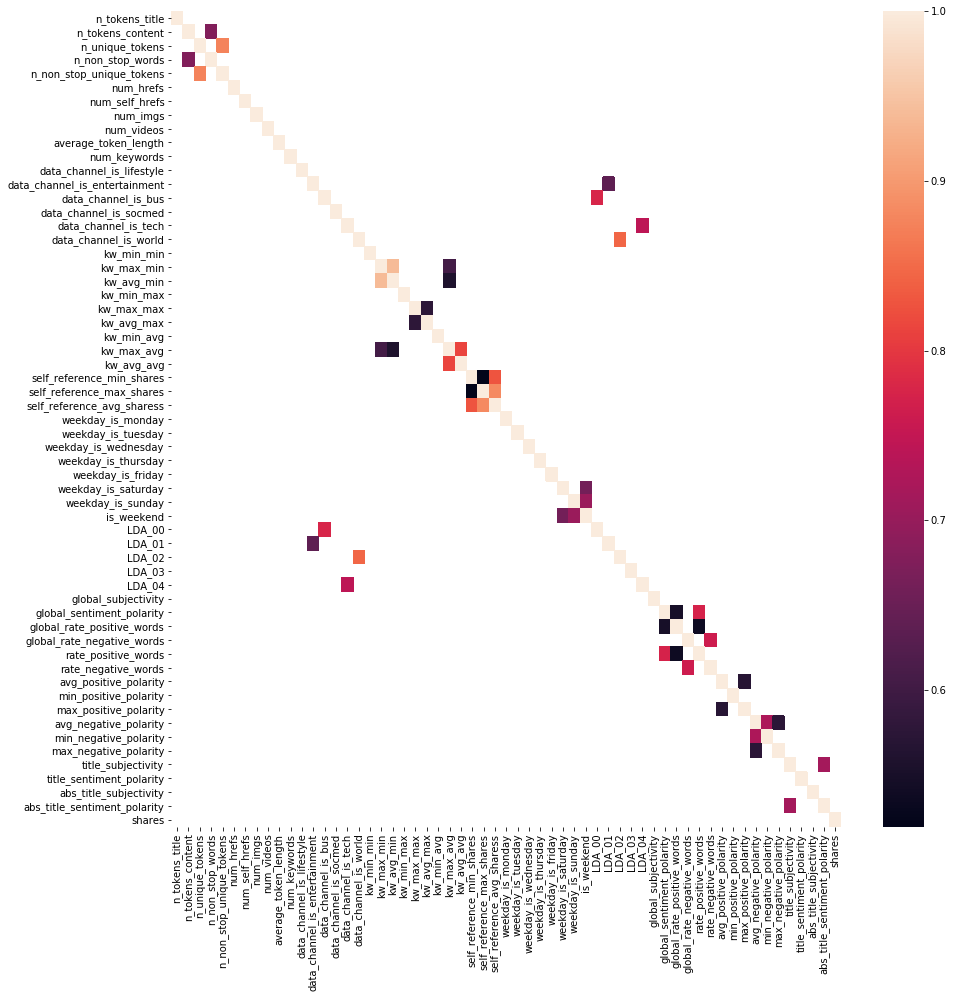

In [118]:
plt.figure(figsize=(15,15))
sns.heatmap(data.corr()[data.corr()>0.5]) # those feature has greater than 0.5 value that positive correlation 
# 

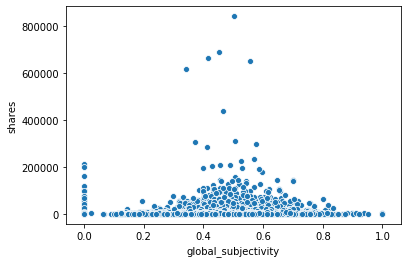

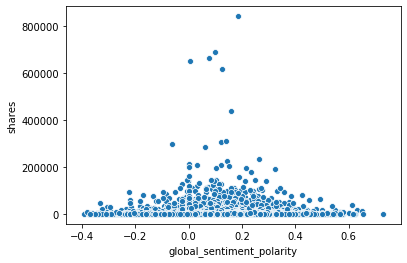

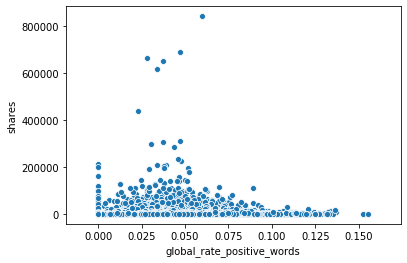

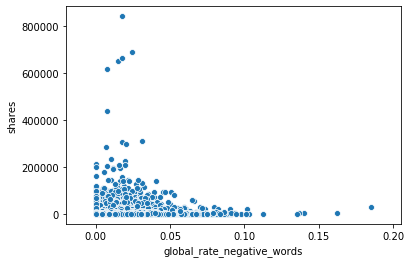

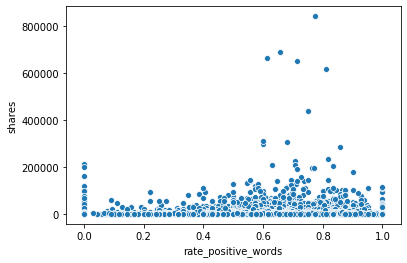

...

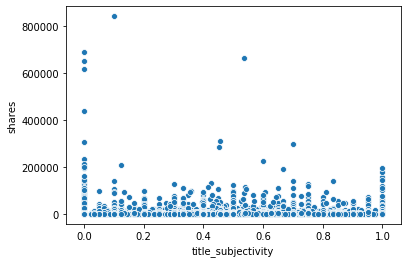

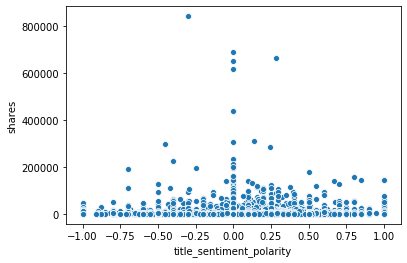

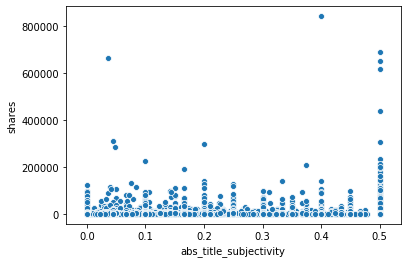

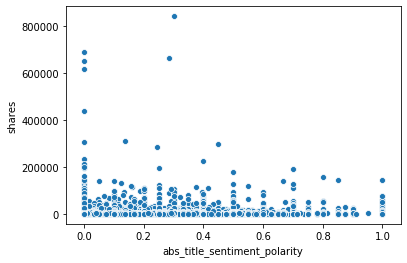

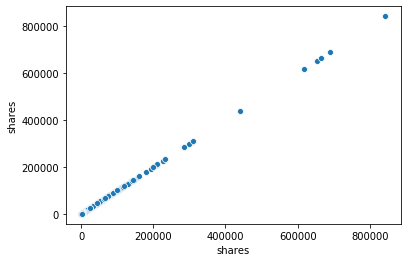

In [121]:
for i in polarity.columns:
    sns.scatterplot(polarity[i],polarity['shares'])
    plt.show()

In [ ]:
# in global subjectivity there is specific range like 0.3 to 0.8 has much shares 
#global rate negative words are low means share is high 
# rate of positve words are high then shares is high 
# polarity also affect the shares of article 

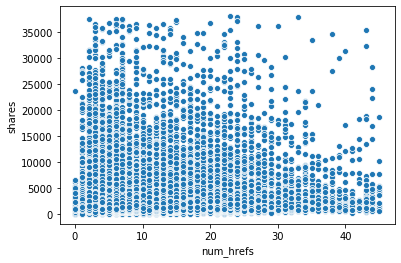

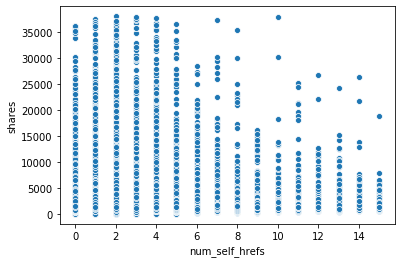

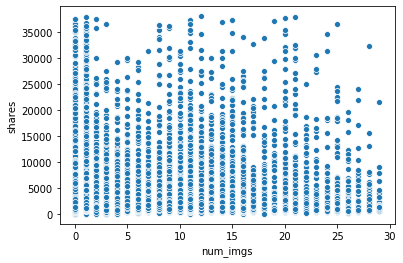

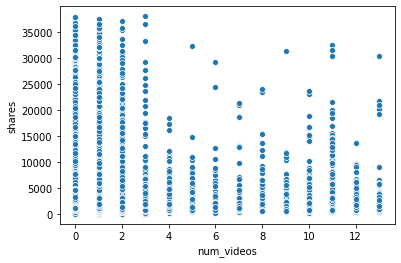

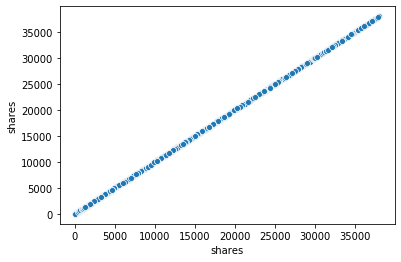

In [124]:
for i in links.columns:
    sns.scatterplot(links[i],links['shares'])
    plt.show()

In [125]:
#  no of links , videos , images and links of other article  has shown if these are less shares are high
# no of links are less than 30 has much shares we can say that if article has less than 30 links so it can be affect the shares
# if less no of links of other article  than shares is high 
# no of videos are also less 

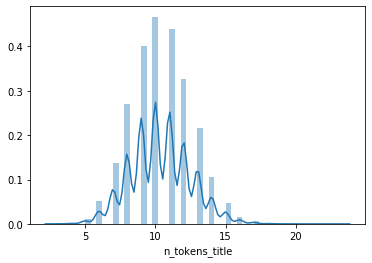

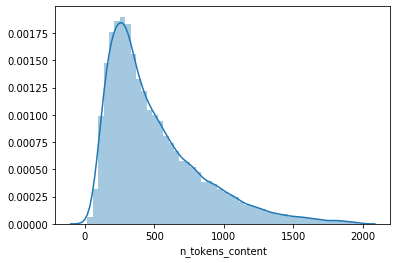

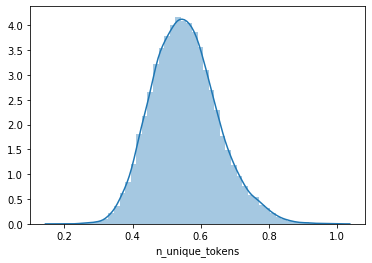

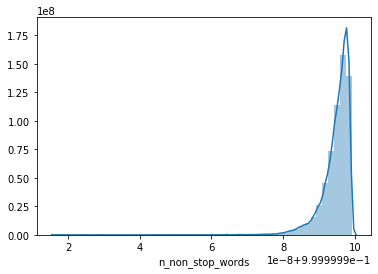

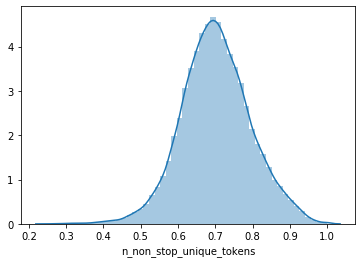

...

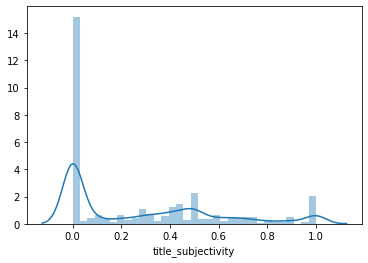

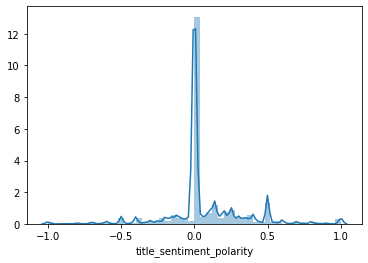

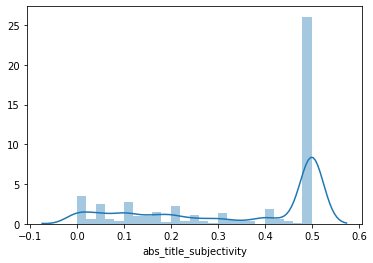

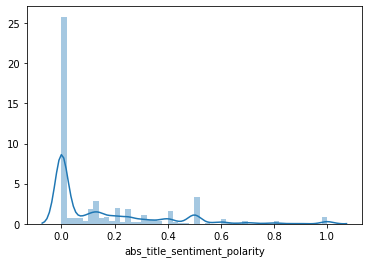

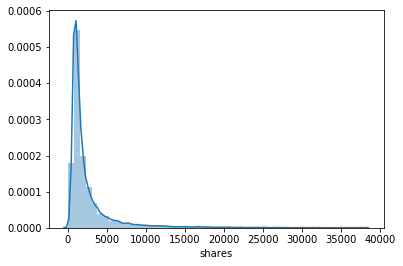

In [126]:
for i in data.columns:
    sns.distplot(data[i])
    plt.show()

  # Assumption of Linear Regression 

#### Linearity ,Normality, Multicollinearity,Homoscedasticity,Autocorrelation 

##  Linearity
Linear regression needs the relationship between the independent and dependent variables to be linear. Let's use a pair plot to check the relation of independent variables with the Shares variable

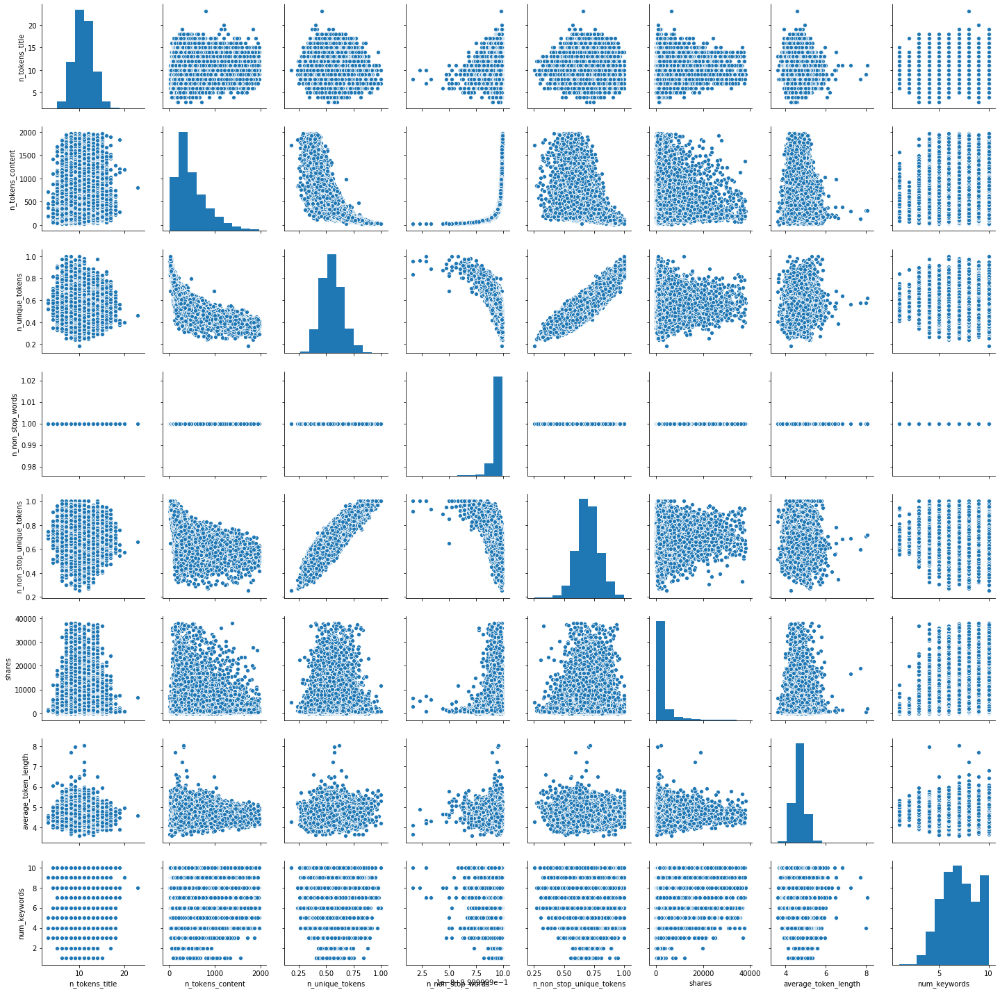

In [183]:
sns.pairplot(data[words.columns])

In [132]:
import statsmodels.stats.api as smi
import statsmodels.api as sm

In [84]:

model=sm.OLS(endog=y,exog=X).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 shares   R-squared:                       0.070
Model:                            OLS   Adj. R-squared:                  0.069
Method:                 Least Squares   F-statistic:                     48.97
Date:                Sun, 12 Jan 2020   Prob (F-statistic):               0.00
Time:                        22:08:32   Log-Likelihood:            -3.3908e+05
No. Observations:               35205   AIC:                         6.783e+05
Df Residuals:                   35150   BIC:                         6.787e+05
Df Model:                          54                                         
Covariance Type:            nonrobust                                         
=================================================================================================
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
n_tokens_title                   22.6024      9.789      2.309      0.021       3.416      41.789
n_tokens_content                 -0.0477      0.116     -0.411      0.681      -0.275       0.180
n_unique_tokens                 173.1979    825.248      0.210      0.834   -1444.313    1790.709
n_non_stop_words              -2.138e+09   9.69e+09     -0.221      0.825   -2.11e+10    1.69e+10
n_non_stop_unique_tokens        234.9459    589.836      0.398      0.690    -921.151    1391.043
num_hrefs                        20.0885      3.371      5.959      0.000      13.480      26.697
num_self_hrefs                  -33.7386      8.939     -3.774      0.000     -51.260     -16.218
num_imgs                         27.3124      4.724      5.781      0.000      18.053      36.572
num_videos                       34.9222     12.305      2.838      0.005      10.804      59.041
average_token_length           -248.9610     84.362     -2.951      0.003    -414.312     -83.610
num_keywords                      6.2871     12.660      0.497      0.619     -18.527      31.102
data_channel_is_lifestyle      -428.1104    135.470     -3.160      0.002    -693.636    -162.584
data_channel_is_entertainment  -597.6078     93.625     -6.383      0.000    -781.116    -414.100
data_channel_is_bus            -594.4601    132.278     -4.494      0.000    -853.730    -335.190
data_channel_is_socmed          249.5503    129.611      1.925      0.054      -4.491     503.592
data_channel_is_tech             -1.1950    128.048     -0.009      0.993    -252.174     249.784
data_channel_is_world          -326.8876    131.795     -2.480      0.013    -585.210     -68.565
kw_min_min                        3.0318      0.552      5.488      0.000       1.949       4.115
kw_max_min                        0.0372      0.017      2.218      0.027       0.004       0.070
kw_avg_min                       -0.2619      0.101     -2.582      0.010      -0.461      -0.063
kw_min_max                       -0.0004      0.000     -0.868      0.386      -0.001       0.000
kw_max_max                        0.0003      0.000      1.525      0.127   -8.58e-05       0.001
kw_avg_max                       -0.0012      0.000     -4.185      0.000      -0.002      -0.001
kw_min_avg                       -0.1959      0.026     -7.492      0.000      -0.247      -0.145
kw_max_avg                       -0.1244      0.009    -14.202      0.000      -0.142      -0.107
kw_avg_avg                        1.0284      0.049     20.798      0.000       0.931       1.125
self_reference_min_shares        -0.0019      0.003     -0.667      0.505      -0.008       0.004
self_reference_max_shares        -0.0038      0.002     -2.092      0.036      -0.007      -0.000
self_reference_avg_sharess        0.0132     

In [47]:
from statsmodels.stats.api  import  linear_rainbow
residual=y_test-ypred

#
H0:  The Null hypothesis is that the regression is correctly modelled as linear

Ha: Alternate is that is no linear

In [80]:
tstatstic,pvalue=linear_rainbow(model)
print(pvalue)
# pvalue is greater than alpha 0.05 (significance level )
# that we reject null hypothisis data is not linear 
# linearity is not met 

0.9999999999999999


In [22]:
from scipy.stats import probplot

Text(0, 0.5, 'residual')

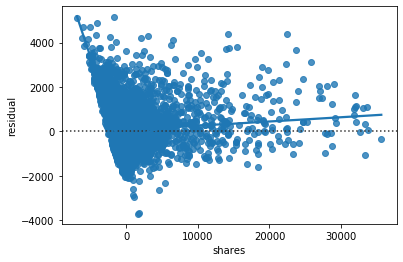

In [40]:
sns.residplot(residual,ypred,lowess=True)  # residual are random in nature 
plt.ylabel('residual')
# there is no pattern in residuals

# After log transformation

In [52]:
def fun(x):
    return np.log(x)

In [85]:
woutlier.describe().T
#we make it linear by apply using  log transformation but it convert into nan and infinity value 
# its not well
# we cant make it linear and also we can conclude from pairplot of the data that there is no feature that has linear
# relation with target variable 
# so linearity assumption is not met 

,count,mean,std,min,25%,50%,75%,max
n_tokens_title,38462.0,2.318518e+00,2.112669e-01,0.693147,2.197225e+00,2.302585e+00,2.484907,3.135494
n_tokens_content,38462.0,6.067790e+00,7.277677e-01,2.890372,5.556828e+00,6.047372e+00,6.591674,9.044758
n_unique_tokens,38462.0,5.468375e-01,1.023145e-01,0.114964,4.774194e-01,5.429817e-01,0.611111,1.000000
n_non_stop_words,38462.0,1.000000e+00,4.022927e-09,1.000000,1.000000e+00,1.000000e+00,1.000000,1.000000
n_non_stop_unique_tokens,38462.0,6.934551e-01,1.006439e-01,0.119134,6.325879e-01,6.937269e-01,0.756944,1.000000
num_hrefs,38462.0,-inf,NaN,-inf,1.609438e+00,2.079442e+00,2.639057,5.717028
num_self_hrefs,38462.0,-inf,NaN,-inf,0.000000e+00,1.098612e+00,1.386294,4.753590
num_imgs,38462.0,-inf,NaN,-inf,0.000000e+00,0.000000e+00,1.386294,4.852030
num_videos,38462.0,-inf,NaN,-inf,-inf,-inf,0.000000,4.510860
average_token_length,38462.0,4.687892e+00,2.832343e-01,3.600000,4.496245e+00,4.674120e+00,4.861903,8.041534


In [84]:
woutlier['n_tokens_content']=woutlier['n_tokens_content'].apply(lambda x:fun(x))
woutlier['shares']=woutlier['shares'].apply(lambda x:fun(x))
woutlier['n_tokens_title']=woutlier['n_tokens_title'].apply(lambda x:fun(x))
woutlier['num_hrefs']=woutlier['num_hrefs'].apply(lambda x:fun(x))
woutlier['num_self_hrefs']=woutlier['num_self_hrefs'].apply(lambda x:fun(x))
woutlier['num_imgs']=woutlier['num_imgs'].apply(lambda x:fun(x))
woutlier['num_videos']=woutlier['num_videos'].apply(lambda x:fun(x))

# Normality Test
## we can using QQ plot 
## mean=median=mode and
## statstical test like shapiro wilk and anderson darling test

In [89]:
from scipy.stats import probplot
import pylab

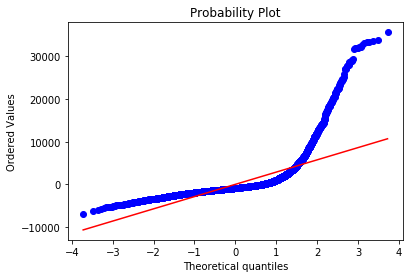

n_tokens_title                    0.176024
n_tokens_content                  1.350663
n_unique_tokens                   0.368939
n_non_stop_words                  0.000000
n_non_stop_unique_tokens         -0.024402
num_hrefs                         1.619604
num_self_hrefs                    1.445108
num_imgs                          2.125271
num_videos                        4.572283
average_token_length              0.503046
num_keywords                     -0.140728
data_channel_is_lifestyle         3.866420
data_channel_is_entertainment     1.793741
data_channel_is_bus               1.748522
data_channel_is_socmed            3.774197
data_channel_is_tech              1.547470
data_channel_is_world             1.321288
kw_min_min                        2.330375
kw_max_min                       37.139030
kw_avg_min                       32.144061
kw_min_max                       10.741168
kw_max_max                       -2.599227
kw_avg_max                        0.603471
kw_min_avg 

In [101]:
probplot(residual,plot=pylab)
plt.show()
# from the graph we can conclude data is not normal but graph can be decieve 
# so we can check different matrix
# we can also conclude from skewness that data is normal or not 
print(data.skew())

2. Mean of Residuals

Residuals as we know are the differences between the true value and the predicted value. 

One of the assumptions of linear regression is that the mean of the residuals should be zero.

In [106]:
np.mean(residual) # residual is not zero

9.240786826571625

In [1]:
from scipy.stats import jarque_bera,anderson

In [35]:
for i in data.columns:
    print(i,anderson(data[i],dist='norm')[0]<1) # from this we can conclude that is not normal

n_tokens_title False
n_tokens_content False
n_unique_tokens False
n_non_stop_words False
n_non_stop_unique_tokens False
num_hrefs False
num_self_hrefs False
num_imgs False
num_videos False
average_token_length False
num_keywords False
data_channel_is_lifestyle False
data_channel_is_entertainment False
data_channel_is_bus False
data_channel_is_socmed False
data_channel_is_tech False
data_channel_is_world False
kw_min_min False
kw_max_min False
kw_avg_min False
kw_min_max False
kw_max_max False
kw_avg_max False
kw_min_avg False
kw_max_avg False
kw_avg_avg False
self_reference_min_shares False
self_reference_max_shares False
self_reference_avg_sharess False
weekday_is_monday False
weekday_is_tuesday False
weekday_is_wednesday False
weekday_is_thursday False
weekday_is_friday False
weekday_is_saturday False
weekday_is_sunday False
is_weekend False
LDA_00 False
LDA_01 False
LDA_02 False
LDA_03 False
LDA_04 False
global_subjectivity False
global_sentiment_polarity False
global_rate_positive_

In [33]:
anderson(data['shares'],dist='norm')[0:2]

(5127.534293853474, array([0.576, 0.656, 0.787, 0.918, 1.092]))

# Multicollinearity test

### Multicollinear means predictors are correlated each other . Presence of correlation in 
### independent variable leads multicollinearity

### If it present then for model it will be difficult to identify that which variable has true effect 
### on dependent variable 

### Multicollinear measure by VIF (variance influence factor vif=(1/1-R^2)  it tells us predictors
### are correlated  if vif=1 then multicollinear is not present and if vif between 5 to 10 then correlation may be present but vif >10 then we confirm that correlation between predictore is present 

### we can drop those features or we can merge into single features

In [37]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [60]:
vif=[variance_inflation_factor(data.values,i) for i in range(data.shape[1])]

C:\Users\Ajay singh\Anaconda3\lib\site-packages\statsmodels\stats\outliers_influence.py:185: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)
C:\Users\Ajay singh\Anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1636: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss


In [61]:
vifd=pd.DataFrame({'vif':vif[0:]},index=data.columns)

In [62]:
vifd[vifd>10] # from this we can say that multicollinarity is present 
 # we can drop or merge depends on features 
    # we can drop these features like n_unique_tokens ,kw_avg_avg
    # we can merge these features kw_max_min,kw_avg_min,rate_positive_words,rate_negative_words
    #self_reference_max_shares,self_reference_avg_sharess

,vif
n_tokens_title,NaN
n_tokens_content,NaN
n_unique_tokens,1.668151e+01
n_non_stop_words,NaN
n_non_stop_unique_tokens,NaN
num_hrefs,NaN
num_self_hrefs,NaN
num_imgs,NaN
num_videos,NaN
average_token_length,NaN


## Autocorrelation Test 


### autocorrelation means errors are correlated each other 

### when errors are correlated each other then something wrong in result 
#### example metrologist forecast the temperature then in winter when they  predict value then the  actual value is always less  and in summer actual  always greater than predicted value it is happen when autocorrealtion is present 

# test is durbin watson

### H0: there is no serial correlation between errors

### Ha: there is serial correlation between errors

### statstic =2(1-r)

#### if statstic is 2 when r=0 r is sample autocorrelation ,statstic between 0 to 2 positive correlation and 2 to 4 negative correlation

In [44]:
from statsmodels.stats.stattools import durbin_watson

In [48]:
durbin_watson(residual)# statstic is less than 2 it indicate that positive serial correlation 
# autocorrelation is present 

1.9936755529853063

### Hetroscedasticity test 

#### means data has different dispresion or we can say data has unequal variance across different range values
### it is not good for model because OLS regression assumes that residual has equal variance across different range of values or follow homoscedasticity but if it is present it ruins the result and get biased coefficient 

### statstical test are breuch pagan and gold feld quant

In [52]:
from statsmodels.stats.api import het_breuschpagan,het_goldfeldquandt,
# H0: equal variance 
# Ha: unequal variance

In [74]:
lm,lmpvalue,fstats,pvalue=het_breuschpagan(residual,x_test)

In [129]:
import statsmodels as sm

In [130]:
pvalue # we reject null hypothisis that hetroscedasticity is present

NameError: name 'pvalue' is not defined

Feature selection

In [140]:
def back_feature_elem (data_frame,dep_var,col_list):
    """ Takes in the dataframe, the dependent variable and a list of column names, runs the regression repeatedly eliminating feature with the highest
    P-value above alpha one at a time and returns the regression summary with all p-values below alpha"""

    while len(col_list)>0 :
        modelr=sm.OLS(dep_var,data_frame[col_list])
        result=modelr.fit(disp=0)
        largest_pvalue=round(result.pvalues,3).nlargest(1)
        if largest_pvalue[0]<(0.05):
            return result
            break
        else:
            col_list=col_list.drop(largest_pvalue.index)

result=back_feature_elem(X_train,y_train,X.columns)

In [139]:
from sklearn.model_selection import train_test_split
X=data.drop('shares',axis=1)
y=data['shares']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)

In [147]:
result.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 shares   R-squared:                       0.081
Model:                            OLS   Adj. R-squared:                  0.080
Method:                 Least Squares   F-statistic:                     68.30
Date:                Sun, 02 Feb 2020   Prob (F-statistic):               0.00
Time:                        00:20:25   Log-Likelihood:            -1.3521e+05
No. Observations:               27750   AIC:                         2.705e+05
Df Residuals:                   27713   BIC:                         2.708e+05
Df Model:                          36                                         
Covariance Type:            nonrobust                                         
=================================================================================================
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
n_tokens_title                    0.3714      0.093      3.987      0.000       0.189       0.554
n_tokens_content                  0.0014      0.000      2.851      0.004       0.000       0.002
num_hrefs                         0.1557      0.021      7.346      0.000       0.114       0.197
num_self_hrefs                   -0.3048      0.058     -5.294      0.000      -0.418      -0.192
num_imgs                          0.0682      0.026      2.596      0.009       0.017       0.120
average_token_length             -2.1965      0.314     -6.999      0.000      -2.812      -1.581
num_keywords                      0.2717      0.119      2.279      0.023       0.038       0.505
data_channel_is_lifestyle        -4.5150      0.919     -4.916      0.000      -6.315      -2.715
data_channel_is_entertainment    -5.9852      0.728     -8.222      0.000      -7.412      -4.558
data_channel_is_bus              -6.6679      0.873     -7.640      0.000      -8.379      -4.957
data_channel_is_world            -2.4956      0.889     -2.806      0.005      -4.239      -0.753
kw_min_min                        0.0209      0.004      5.918      0.000       0.014       0.028
kw_max_min                        0.0005      0.000      3.001      0.003       0.000       0.001
kw_avg_min                       -0.0030      0.001     -3.288      0.001      -0.005      -0.001
kw_min_max                    -8.034e-06   3.85e-06     -2.085      0.037   -1.56e-05   -4.82e-07
kw_avg_max                    -9.133e-06   2.52e-06     -3.624      0.000   -1.41e-05   -4.19e-06
kw_min_avg                       -0.0019      0.000     -7.614      0.000      -0.002      -0.001
kw_max_avg                       -0.0012   8.11e-05    -14.605      0.000      -0.001      -0.001
kw_avg_avg                        0.0094      0.000     20.552      0.000       0.009       0.010
self_reference_min_shares      7.705e-05   1.17e-05      6.578      0.000    5.41e-05       0.000
self_reference_max_shares      1.759e-05    5.2e-06      3.384      0.001     7.4e-06    2.78e-05
weekday_is_monday                33.7688      2.362     14.297      0.000      29.139      38.398
weekday_is_tuesday               30.9984      2.364     13.114      0.000      26.365      35.631
weekday_is_wednesday             31.4950      2.362     13.332      0.000      26.865      36.125
weekday_is_thursday              31.5907      2.359     13.391      0.000      26.967      36.215
weekday_is_friday                33.4008      2.376     14.057      0.000      28.743      38.058
weekday_is_saturday              12.7400      0.950     13.404      0.000      10.877      14.603
weekday_is_sunday                12.0140      0.960     12.521      0.000      10.133      13.895
is_weekend                       24.7540     

In [150]:
np.sqrt(result.mse_model)

261.39229843471605

In [65]:
X=data.drop('shares',axis=1)
y=data['shares']

RFE

In [77]:
from sklearn.feature_selection import RFE
rfe=RFE(estimator=lr,n_features_to_select=30)
selct=rfe.fit(X,y)
sd=pd.DataFrame(selct.ranking_,index=X.columns)
lk=sd[sd[0]==1]
lk.index

Index(['n_unique_tokens', 'n_non_stop_words', 'data_channel_is_lifestyle',
       'data_channel_is_entertainment', 'data_channel_is_bus',
       'data_channel_is_tech', 'data_channel_is_world', 'weekday_is_monday',
       'weekday_is_tuesday', 'weekday_is_wednesday', 'weekday_is_thursday',
       'weekday_is_friday', 'weekday_is_saturday', 'weekday_is_sunday',
       'is_weekend', 'LDA_00', 'LDA_01', 'LDA_02', 'LDA_03', 'LDA_04',
       'global_subjectivity', 'global_sentiment_polarity',
       'global_rate_positive_words', 'global_rate_negative_words',
       'rate_positive_words', 'avg_positive_polarity', 'min_positive_polarity',
       'avg_negative_polarity', 'max_negative_polarity',
       'title_sentiment_polarity'],
      dtype='object')

In [116]:
X=data[['n_unique_tokens', 'n_non_stop_words', 'data_channel_is_lifestyle',
       'data_channel_is_entertainment', 'data_channel_is_bus',
       'data_channel_is_tech', 'data_channel_is_world', 'weekday_is_monday',
       'weekday_is_tuesday', 'weekday_is_wednesday', 'weekday_is_thursday',
       'weekday_is_friday', 'weekday_is_saturday', 'weekday_is_sunday',
       'is_weekend', 'LDA_00', 'LDA_01', 'LDA_02', 'LDA_03', 'LDA_04',
       'global_subjectivity', 'global_sentiment_polarity',
       'global_rate_positive_words', 'global_rate_negative_words',
       'rate_positive_words', 'avg_positive_polarity', 'min_positive_polarity',
       'avg_negative_polarity', 'max_negative_polarity',
       'title_sentiment_polarity']]
y=data['shares']

In [81]:
from sklearn.model_selection import train_test_split
y=data['shares']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)

from sklearn.ensemble import RandomForestRegressor
rf=RandomForestRegressor()
model=rf.fit(X_train,y_train)
y_pred=rf.predict(X_test)
from sklearn.metrics import r2_score
print(r2_score(y_test,y_pred))
print(rf.score(X_train,y_train))
print(rf.score(X_test,y_test))
print(np.sqrt(mean_squared_error(y_test,y_pred)))

-0.01374354082291429
0.8581441799873881
-0.01374354082291429
3890.388390315755


In [108]:
pd.DataFrame(selct.ranking_,index=['n_tokens_title', 'n_tokens_content', 'n_unique_tokens',
       'n_non_stop_words', 'n_non_stop_unique_tokens', 'num_hrefs',
       'num_self_hrefs', 'num_imgs', 'num_videos', 'average_token_length',
       'num_keywords', 'data_channel_is_lifestyle',
       'data_channel_is_entertainment', 'data_channel_is_bus',
       'data_channel_is_socmed', 'data_channel_is_tech',
       'data_channel_is_world', 'kw_min_min', 'kw_max_min', 'kw_avg_min',
       'kw_min_max', 'kw_max_max', 'kw_avg_max', 'kw_min_avg', 'kw_max_avg',
       'kw_avg_avg', 'self_reference_min_shares', 'self_reference_max_shares',
       'self_reference_avg_sharess', 'weekday_is_monday', 'weekday_is_tuesday',
       'weekday_is_wednesday', 'weekday_is_thursday', 'weekday_is_friday',
       'weekday_is_saturday', 'weekday_is_sunday', 'is_weekend', 'LDA_00',
       'LDA_01', 'LDA_02', 'LDA_03', 'LDA_04', 'global_subjectivity',
       'global_sentiment_polarity', 'global_rate_positive_words',
       'global_rate_negative_words', 'rate_positive_words',
       'rate_negative_words', 'avg_positive_polarity', 'min_positive_polarity',
       'max_positive_polarity', 'avg_negative_polarity',
       'min_negative_polarity', 'max_negative_polarity', 'title_subjectivity',
       'title_sentiment_polarity', 'abs_title_subjectivity',
       'abs_title_sentiment_polarity'])

,0
n_tokens_title,16
n_tokens_content,21
n_unique_tokens,1
n_non_stop_words,1
n_non_stop_unique_tokens,12
num_hrefs,13
num_self_hrefs,11
num_imgs,8
num_videos,9
average_token_length,7


In [110]:
X=data[[ 'n_unique_tokens',
       'n_non_stop_words', 'data_channel_is_lifestyle',
       'data_channel_is_entertainment', 'data_channel_is_bus',
       'data_channel_is_socmed', 'data_channel_is_tech',
       'data_channel_is_world', 'weekday_is_monday', 'weekday_is_tuesday',
       'weekday_is_wednesday', 'weekday_is_thursday', 'weekday_is_friday',
       'weekday_is_saturday', 'weekday_is_sunday', 'is_weekend', 'LDA_00',
       'LDA_01', 'LDA_02', 'LDA_03', 'LDA_04', 'global_subjectivity',
       'global_sentiment_polarity', 'global_rate_positive_words',
       'global_rate_negative_words', 'rate_positive_words', 'avg_positive_polarity', 'min_positive_polarity',
        'avg_negative_polarity', 'max_negative_polarity']]

In [118]:
from sklearn.model_selection import train_test_split
X=data[['n_unique_tokens', 'n_non_stop_words', 'data_channel_is_lifestyle',
       'data_channel_is_entertainment', 'data_channel_is_bus',
       'data_channel_is_tech', 'data_channel_is_world', 'weekday_is_monday',
       'weekday_is_tuesday', 'weekday_is_wednesday', 'weekday_is_thursday',
       'weekday_is_friday', 'weekday_is_saturday', 'weekday_is_sunday',
       'is_weekend', 'LDA_00', 'LDA_01', 'LDA_02', 'LDA_03', 'LDA_04',
       'global_subjectivity', 'global_sentiment_polarity',
       'global_rate_positive_words', 'global_rate_negative_words',
       'rate_positive_words', 'avg_positive_polarity', 'min_positive_polarity',
       'avg_negative_polarity', 'max_negative_polarity',
       'title_sentiment_polarity']]
y=data['shares']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)

from sklearn.preprocessing import StandardScaler
sc=StandardScaler()

scaleXtrain=sc.fit_transform(X_train)

X_train=pd.DataFrame(scaleXtrain, columns=list(X_train))

scaleXtest=sc.transform(X_test)

X_test=pd.DataFrame(scaleXtest, columns=list(X_train))

from sklearn.linear_model import Lasso
from sklearn.metrics import mean_squared_error,r2_score
lp=Lasso()
modelreg=lp.fit(X_train,y_train)
ypredreg=lp.predict(X_test)
print(np.sqrt(mean_squared_error(y_test,ypredreg)))
print(r2_score(y_test,ypredreg))

33.3419380860254
0.03560344052850695


### LASSO

In [119]:
from sklearn.model_selection import cross_val_score
def rmse_cv(model):
    rmse= np.sqrt(-cross_val_score(model, X_train, y_train, scoring="neg_mean_squared_error", cv = 5))
    return(rmse)

In [120]:
y_train.shape

(27750,)

In [121]:
X=data.drop('shares',axis=1)
y=data['shares']
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)
from sklearn.linear_model import LassoCV
model_lasso = LassoCV(alphas = [1, 0.1, 0.001, 0.0005]).fit(X_train, y_train)
rmse_cv(model_lasso).mean()

C:\Users\Ajay singh\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:472: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10557929.767372508, tolerance: 2322.2927006185078
  tol, rng, random, positive)
C:\Users\Ajay singh\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:472: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10604806.105750028, tolerance: 2322.2927006185078
  tol, rng, random, positive)
C:\Users\Ajay singh\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:472: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11330389.02288394, tolerance: 2489.8124697603803
  tol, rng, random, positive)
C:\Users\Ajay singh\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:472: ConvergenceWarning: Objective d

C:\Users\Ajay singh\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:472: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7880464.374221106, tolerance: 1781.4008043809124
  tol, rng, random, positive)
C:\Users\Ajay singh\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:472: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7923473.8262647055, tolerance: 1781.4008043809124
  tol, rng, random, positive)
C:\Users\Ajay singh\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:472: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8216892.251482294, tolerance: 1823.2851750033062
  tol, rng, random, positive)
C:\Users\Ajay singh\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:472: ConvergenceWarning: Objective di

38.314672146024996

In [122]:
model_lasso.coef_

array([ 2.76892050e-01,  1.30166684e-03,  0.00000000e+00,  3.24375468e-02,
        0.00000000e+00,  1.62580065e-01, -2.72034610e-01,  7.20465107e-02,
        8.18204262e-02, -9.66225951e-01,  3.22367593e-01, -0.00000000e+00,
       -4.25158340e+00, -2.65218211e-02,  3.46991139e+00,  2.35954000e+00,
       -3.64716674e-02,  2.09998657e-02,  5.10990827e-04, -3.36975125e-03,
       -9.01625246e-06, -1.18576956e-06, -8.51671943e-06, -2.10268182e-03,
       -1.31625935e-03,  1.04583494e-02,  8.66620809e-05,  1.99647352e-05,
       -8.98297807e-06,  3.71604198e-01, -1.22899642e+00, -7.13142419e-01,
       -6.15720588e-01,  1.07190042e-05,  0.00000000e+00,  0.00000000e+00,
        3.64489394e+00,  5.87944420e-01, -0.00000000e+00, -4.62142654e+00,
        0.00000000e+00,  0.00000000e+00,  1.76304152e+00,  0.00000000e+00,
        0.00000000e+00, -0.00000000e+00,  0.00000000e+00, -0.00000000e+00,
        0.00000000e+00, -0.00000000e+00,  0.00000000e+00, -0.00000000e+00,
       -5.85326849e-02, -

In [123]:
coef = pd.Series(model_lasso.coef_, index = X_train.columns)
coef.head()

n_tokens_title              0.276892
n_tokens_content            0.001302
n_unique_tokens             0.000000
n_non_stop_words            0.032438
n_non_stop_unique_tokens    0.000000
dtype: float64

In [124]:
print("Lasso picked " + str(sum(coef != 0)) + " variables and eliminated the other " +  str(sum(coef == 0)) + " variables")

Lasso picked 37 variables and eliminated the other 21 variables


In [125]:
coef[coef!=0].index

Index(['n_tokens_title', 'n_tokens_content', 'n_non_stop_words', 'num_hrefs',
       'num_self_hrefs', 'num_imgs', 'num_videos', 'average_token_length',
       'num_keywords', 'data_channel_is_entertainment', 'data_channel_is_bus',
       'data_channel_is_socmed', 'data_channel_is_tech',
       'data_channel_is_world', 'kw_min_min', 'kw_max_min', 'kw_avg_min',
       'kw_min_max', 'kw_max_max', 'kw_avg_max', 'kw_min_avg', 'kw_max_avg',
       'kw_avg_avg', 'self_reference_min_shares', 'self_reference_max_shares',
       'self_reference_avg_sharess', 'weekday_is_monday', 'weekday_is_tuesday',
       'weekday_is_wednesday', 'weekday_is_thursday', 'weekday_is_friday',
       'is_weekend', 'LDA_00', 'LDA_02', 'global_subjectivity',
       'min_negative_polarity', 'title_subjectivity'],
      dtype='object')

In [126]:
from sklearn.model_selection import train_test_split
X=data[['n_tokens_title', 'n_tokens_content', 'n_non_stop_words', 'num_hrefs',
       'num_self_hrefs', 'num_imgs', 'num_videos', 'average_token_length',
       'num_keywords', 'data_channel_is_entertainment', 'data_channel_is_bus',
       'data_channel_is_socmed', 'data_channel_is_tech',
       'data_channel_is_world', 'kw_min_min', 'kw_max_min', 'kw_avg_min',
       'kw_min_max', 'kw_max_max', 'kw_avg_max', 'kw_min_avg', 'kw_max_avg',
       'kw_avg_avg', 'self_reference_min_shares', 'self_reference_max_shares',
       'self_reference_avg_sharess', 'weekday_is_monday', 'weekday_is_tuesday',
       'weekday_is_wednesday', 'weekday_is_thursday', 'weekday_is_friday',
       'is_weekend', 'LDA_00', 'LDA_02', 'global_subjectivity',
       'min_negative_polarity', 'title_subjectivity']]
y=data['shares']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)

from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error,r2_score
lrrr=LinearRegression()
modelreg=lp.fit(X_train,y_train)
ypredreg=lp.predict(X_test)
print(np.sqrt(mean_squared_error(y_test,ypredreg)))
print(r2_score(y_test,ypredreg))

32.742681591955105
0.06995821603752794
